# Bloque 1 — IO + limpieza

In [1]:
import numpy as np
import pandas as pd

DATA_DIR = "Datas"
FIG_DIR  = "Figures"
OUT_DIR  = "Outputs"

def load_event(date: int) -> pd.DataFrame:
    """Load one event file allYYYYMMDD.txt (semicolon separated, wide stations)."""
    path = f"{DATA_DIR}/all{date}.txt"
    df = pd.read_csv(path, sep=";", dtype=str)

    # Normalize nulls (handles '   null', 'null', '', etc.)
    df = df.replace(r"^\s*null\s*$", np.nan, regex=True)

    df["DATETIME"] = pd.to_datetime(df["DATETIME"])
    df = df.set_index("DATETIME")
    df.index.name = None

    # Convert station columns to float
    for c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="coerce")

    return df


# Bloque 2 — EWM + derivada robusta

In [2]:
def ewm_smooth(x: pd.Series, span: int = 60, min_periods: int = 30) -> pd.Series:
    """Exponentially weighted mean smoothing."""
    return x.ewm(span=span, adjust=False, min_periods=min_periods).mean()

def robust_derivative(x: pd.Series, smooth_span: int = None) -> pd.Series:
    """
    Robust-ish derivative for 1-min sampled series:
    gradient over time index + optional EWM smoothing of derivative.
    """
    # assumes uniform 1-min sampling; gradient works fine even with small gaps but best after cleaning
    dx = pd.Series(np.gradient(x.values), index=x.index)
    if smooth_span is not None:
        dx = ewm_smooth(dx, span=smooth_span, min_periods=max(5, smooth_span//3))
    return dx


# Bloque 3 — Baseline robusto + onset por umbral

In [3]:
def mad(x: np.ndarray) -> float:
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]
    if x.size == 0:
        return np.nan
    med = np.median(x)
    return np.median(np.abs(x - med))

def robust_baseline(x_s: pd.Series, t_ref: pd.Timestamp, hours: int = 6) -> dict:
    """
    Baseline window ends at t_ref (exclusive). Uses median and MAD.
    """
    t0 = t_ref - pd.Timedelta(hours=hours)
    w  = x_s.loc[t0:t_ref].iloc[:-1]  # exclude t_ref itself
    arr = w.values.astype(float)

    med = np.nanmedian(arr)
    m   = mad(arr)
    return {"median": med, "mad": m, "t_start": t0, "t_end": t_ref}

def detect_onset_threshold(
    x_s: pd.Series,
    baseline: dict,
    k: float = 6.0,
    sustain_min: int = 10,
    direction: str = "drop",
) -> pd.Timestamp | None:
    """
    Onset = first time the smoothed counts drop below (median - k*MAD) for sustain_min minutes.
    """
    med, m = baseline["median"], baseline["mad"]
    if not np.isfinite(m) or m == 0:
        return None

    thr = med - k*m if direction == "drop" else med + k*m
    cond = (x_s <= thr) if direction == "drop" else (x_s >= thr)

    # sustain criterion via rolling sum over boolean mask
    hit = cond.rolling(sustain_min).sum() >= sustain_min
    idx = hit[hit].index
    return idx[0] if len(idx) else None


# Bloque 3b — Onset por mínimo de derivada (opcional, como control/diagnóstico)

In [4]:
def detect_onset_derivative(
    dx_s: pd.Series,
    search_start: pd.Timestamp,
    search_end: pd.Timestamp
) -> pd.Timestamp | None:
    """
    Onset candidate = argmin derivative within a search interval.
    """
    w = dx_s.loc[search_start:search_end]
    if w.dropna().empty:
        return None
    return w.idxmin()


# Bloque 3c — Plot diagnóstico (crudo + EWM + derivada + t0)

In [5]:
import matplotlib.pyplot as plt

def plot_onset_diagnostic(df: pd.DataFrame, station: str, x_s: pd.Series, dx_s: pd.Series,
                          t0_thr=None, t0_der=None, title=None, savepath=None):
    fig, ax = plt.subplots(1, 1, figsize=(14, 3))
    ax.plot(df.index, df[station], lw=0.8, label="raw")
    ax.plot(x_s.index, x_s, lw=1.5, label="EWM")

    if t0_thr is not None:
        ax.axvline(t0_thr, ls="--", lw=1.5, label="t0 (threshold)")
    if t0_der is not None:
        ax.axvline(t0_der, ls=":", lw=1.8, label="t0 (derivative)")

    ax.set_title(title or f"{station} onset diagnostic")
    ax.grid(alpha=0.3)
    ax.legend(loc="upper right")
    plt.tight_layout()
    if savepath:
        plt.savefig(savepath, dpi=300)
    plt.show()

    # derivative plot
    fig, ax = plt.subplots(1, 1, figsize=(14, 2.6))
    ax.plot(dx_s.index, dx_s, lw=1.0, label="d/dt(EWM)")
    if t0_thr is not None:
        ax.axvline(t0_thr, ls="--", lw=1.5)
    if t0_der is not None:
        ax.axvline(t0_der, ls=":", lw=1.8)
    ax.grid(alpha=0.3)
    ax.legend(loc="upper right")
    plt.tight_layout()
    if savepath:
        plt.savefig(savepath.replace(".png", "_deriv.png"), dpi=300)
    plt.show()


# 5) Motor de ventanas (causal vs simétrica)
Esto lo necesitamos para calcular métricas en una grilla temporal “válida”.

In [6]:
import pandas as pd
from typing import Optional

def window_slice(t: pd.Timestamp, W_min: int, mode: str):
    """
    Returns slice bounds [t_left, t_right] for window of length W_min.
    mode:
      - 'causal':    [t - W, t]
      - 'symmetric': [t - W/2, t + W/2]
    """
    if mode == "causal":
        t_left  = t - pd.Timedelta(minutes=W_min)
        t_right = t
    elif mode == "symmetric":
        half = W_min // 2
        t_left  = t - pd.Timedelta(minutes=half)
        t_right = t + pd.Timedelta(minutes=half)
    else:
        raise ValueError("mode must be 'causal' or 'symmetric'")
    return t_left, t_right


def compute_marker_series(
    x_s: pd.Series,
    metric_names: Optional[list[str]] = None,
    *,
    W_min: int = 120,
    step_min: int = 5,
    mode: str = "causal",
    min_valid_frac: float = 0.95,
    min_len: int = 60,
    do_zscore: bool = False,
    params_by_metric: Optional[dict[str, dict]] = None,
) -> pd.DataFrame:
    """
    Compute Mk(t) for each metric using sliding windows over x_s.

    Uses the inclusive functions:
      - compute_metrics(x_window, names=..., min_len=..., do_zscore=..., params_by_metric=...)

    Returns:
      DataFrame indexed by evaluation time t, columns = metric_names.
    """
    if metric_names is None:
        # will use compute_metrics default list if None
        metric_names_for_df = None
    else:
        metric_names_for_df = list(metric_names)

    times = x_s.index[::step_min]
    rows = []
    out_t = []

    for t in times:
        tL, tR = window_slice(t, W_min=W_min, mode=mode)
        w = x_s.loc[tL:tR]

        # coverage checks
        if len(w) < max(min_len, int(W_min * 0.8)):
            continue
        if w.notna().mean() < min_valid_frac:
            continue

        # compute metrics on this window (dict: {metric: value})
        vals = compute_metrics(
            w.values,
            names=metric_names_for_df,        # None -> defaults inside compute_metrics
            min_len=min_len,
            do_zscore=do_zscore,
            params_by_metric=params_by_metric,
        )

        out_t.append(t)
        rows.append(vals)

    Mk = pd.DataFrame(rows, index=pd.DatetimeIndex(out_t))

    # Ensure stable column order
    if metric_names_for_df is None:
        # compute_metrics default list must match this order
        default_names = [
            "entropy", "sampen", "permutation_entropy", "shannon_entropy",
            "spectral_entropy", "app_entropy",
            "hurst", "dfa", "mfhurst_b",
            "higuchi_fd", "katz_fd", "petrosian_fd", "lepel_ziv",
            "corr_dim",
        ]
        Mk = Mk.reindex(columns=default_names)
    else:
        Mk = Mk.reindex(columns=metric_names_for_df)

    return Mk


# 6) Señal en marcadores (z-score robusto + lead)

In [7]:
def robust_zscore(s: pd.Series) -> pd.Series:
    arr = np.asarray(s.values, dtype=float)
    arr = arr[np.isfinite(arr)]
    if arr.size == 0:
        return pd.Series(np.nan, index=s.index)

    med = np.median(arr)
    m = mad(arr)
    if not np.isfinite(m) or m == 0:
        return pd.Series(np.nan, index=s.index)

    return (s - med) / (1.4826 * m)  # 1.4826 ~ MAD->sigma

def detect_marker_signal(
    dMk: pd.Series,
    t0: pd.Timestamp,
    L_min: int = 480,
    z_thr: float = 1.3,
    sustain_min: int = 5,
    search: str = "pre",  # 'pre' or 'both'
):
    """
    Find earliest time where |z|>=z_thr for sustain_min minutes.
    Returns signal time and lead (minutes).
    """
    if t0 is None:
        return None, None

    if search == "pre":
        w = dMk.loc[t0 - pd.Timedelta(minutes=L_min) : t0 - pd.Timedelta(minutes=1)]
    elif search == "both":
        w = dMk.loc[t0 - pd.Timedelta(minutes=L_min) : t0 + pd.Timedelta(minutes=L_min)]
    else:
        raise ValueError("search must be 'pre' or 'both'")

    z = robust_zscore(w)
    cond = z.abs() >= z_thr
    hit = cond.rolling(sustain_min).sum() >= sustain_min
    idx = hit[hit].index
    if len(idx) == 0:
        return None, None

    t_sig = idx[0]
    lead = (t_sig - t0).total_seconds() / 60.0
    return t_sig, lead


# Bloque 7 — Motor de métricas (diccionario → funciones)

In [8]:
import numpy as np

# Requiere: scipy, nolds, antropy
from scipy.stats import entropy as sp_entropy
import nolds
import antropy as ant


def _as_clean_1d(x) -> np.ndarray:
    """1D float array, sin NaNs/inf."""
    arr = np.asarray(x, dtype=float).ravel()
    arr = arr[np.isfinite(arr)]
    return arr


def _zscore(arr: np.ndarray) -> np.ndarray:
    mu = np.mean(arr)
    sd = np.std(arr)
    if not np.isfinite(sd) or sd == 0:
        return arr * np.nan
    return (arr - mu) / sd


def compute_metric(
    x_window,
    name: str,
    *,
    min_len: int = 60,
    do_zscore: bool = False,
    params: dict | None = None,
) -> float:
    """
    Calcula UNA métrica sobre una ventana.
    - name: string con el nombre de la métrica (ver abajo).
    - params: sobreescribe parámetros por defecto de esa métrica.
    Devuelve NaN si falla o si la ventana es corta.
    """
    arr = _as_clean_1d(x_window)
    if len(arr) < min_len:
        return np.nan
    if do_zscore:
        arr = _zscore(arr)
        if np.all(~np.isfinite(arr)):
            return np.nan

    p = {} if params is None else dict(params)

    try:
        # ---------- Entropías ----------
        if name == "entropy":  # scipy.stats.entropy (ojo: no es Shannon de histograma)
            # requiere arr >= 0 y normalizada si se interpreta como pmf; aquí lo dejamos tal cual (como lo venías usando)
            return float(sp_entropy(arr, **p))

        elif name == "sampen":
            return float(nolds.sampen(arr, **p))

        elif name == "permutation_entropy":
            # defaults como en tu código
            p.setdefault("normalize", False)
            p.setdefault("order", 3)
            p.setdefault("delay", 1)
            return float(ant.perm_entropy(arr, **p))

        elif name == "shannon_entropy":
            # Shannon sobre histograma (pmf aproximada)
            hist = np.histogram(arr, bins="auto", density=True)[0]
            hist = hist[np.isfinite(hist)]
            return float(sp_entropy(hist, **p))

        elif name == "spectral_entropy":
            # defaults como en tu código
            p.setdefault("method", "welch")
            p.setdefault("sf", 1.0)        # esto es "sampling frequency" (loss datos son 1/min, sf=1.0 sería más natural)
            p.setdefault("normalize", True)
            # evita warning: nperseg > len(arr)
            p.setdefault("nperseg", min(256, len(arr)))
            return float(ant.spectral_entropy(arr, **p))

        elif name == "app_entropy":
            return float(ant.app_entropy(arr, **p))

        # ---------- Hurst / scaling ----------
        elif name == "hurst":
            return float(nolds.hurst_rs(arr, **p))

        elif name == "dfa":
            # defaults como en tu código
            p.setdefault("order", 2)
            p.setdefault("overlap", True)
            return float(nolds.dfa(arr, **p))

        elif name == "mfhurst_b":
            return float(nolds.mfhurst_b(arr, **p))

        # ---------- Fractal dimension / complexity ----------
        elif name == "higuchi_fd":
            p.setdefault("kmax", 10)
            return float(ant.higuchi_fd(arr, **p))

        elif name == "katz_fd":
            return float(ant.katz_fd(arr, **p))

        elif name == "petrosian_fd":
            return float(ant.petrosian_fd(arr, **p))

        elif name == "lepel_ziv":
            # mantiene tu implementación (ojo: nombre original tenía typo "lepel")
            return float(ant.lziv_complexity(np.array(arr), **p))

        # ---------- Chaos indicators ----------
        elif name == "corr_dim":
            p.setdefault("emb_dim", 2)
            return float(nolds.corr_dim(arr, **p))

        else:
            raise KeyError(f"Métrica desconocida: {name}")

    except Exception:
        return np.nan


def compute_metrics(
    x_window,
    names: list[str] | None = None,
    *,
    min_len: int = 60,
    do_zscore: bool = False,
    params_by_metric: dict[str, dict] | None = None,
) -> dict[str, float]:
    """
    Calcula VARIAS métricas sobre una ventana.
    params_by_metric: dict opcional {metric_name: {param: value}}
    """
    if names is None:
        # Default “ALL” 
        names = [
            "entropy", "sampen", "permutation_entropy", "shannon_entropy",
            "spectral_entropy", "app_entropy",
            "hurst", #"dfa", "mfhurst_b",
            "higuchi_fd", "katz_fd", "petrosian_fd", "lepel_ziv",
            "corr_dim",
        ]

    params_by_metric = {} if params_by_metric is None else params_by_metric

    out = {}
    for nm in names:
        out[nm] = compute_metric(
            x_window,
            nm,
            min_len=min_len,
            do_zscore=do_zscore,
            params=params_by_metric.get(nm, None),
        )
    return out


# Bloque 8 — Ejecutar por evento y estación + exportar outputs

In [9]:
import os
import pandas as pd
import numpy as np

os.makedirs(OUT_DIR, exist_ok=True)
os.makedirs(FIG_DIR, exist_ok=True)

EVENT_STATIONS = {
    20230423: ['ATHN', 'DOMB', 'SOPO', 'SOPB', 'THUL', 'NAIN', 'INVK',
               'FSMT', 'TXBY', 'NRLK', 'APTY', 'OULU', 'CALG', 'DOMC', 
               'YKTK', 'KERG', 'NEWK', 'MXCO', 'NANM', 'KIEL2', 'BKSN', 
               'JUNG', 'TERA', 'LMKS', 'IRK2', 'IRKT', 'JUNG1', 'PWNK'],
    20240510: ['MXCO', 'DOMB', 'SOPO', 'SOPB', 'MWSN', 'MWSB', 'THUL', 
               'PWNK', 'NAIN', 'TXBY', 'APTY', 'OULU', 'DOMC', 'KERG', 
               'CALG', 'KIEL2', 'NANM', 'CALM', 'BKSN', 'JUNG', 'JUNG1', 
               'YKTK', 'LMKS', 'NEWK', 'TERA', 'IRK3', 'DRBS', 'INVK'],  
}

def run_station_pipeline(
    df: pd.DataFrame,
    station: str,
    *,
    ewm_span: int = 60,
    ewm_minp: int = 30,
    dx_smooth_span: int = 30,
    baseline_hours: int = 6,
    onset_k: float = 6.0,
    onset_sustain: int = 10,
    # markers
    metric_names: list[str] | None = None,
    W_min: int = 120,
    step_min: int = 5,
    window_mode: str = "causal",
    marker_min_valid_frac: float = 0.95,
    marker_min_len: int = 60,
    marker_do_zscore: bool = False,
    params_by_metric: dict[str, dict] | None = None,
    # signal detection on marker derivatives
    L_min: int = 480,
    z_thr: float = 1.3,
    z_sustain: int = 5,
    marker_search: str = "pre",
):
    if station not in df.columns:
        return None, None, f"missing_station:{station}"

    x = df[station].copy()
    x_s = ewm_smooth(x, span=ewm_span, min_periods=ewm_minp)
    dx_s = robust_derivative(x_s, smooth_span=dx_smooth_span)

    # baseline reference: you need a reference time; simplest is "start of day + baseline_hours"
    # Better: choose a t_ref near early part of the record; here we use first timestamp + baseline_hours.
    t_ref = x_s.index[0] + pd.Timedelta(hours=baseline_hours)
    baseline = robust_baseline(x_s, t_ref=t_ref, hours=baseline_hours)

    t0_thr = detect_onset_threshold(
        x_s, baseline, k=onset_k, sustain_min=onset_sustain, direction="drop"
    )

    # derivative onset as diagnostic: search around where threshold onset is found (if found)
    if t0_thr is not None:
        t0_der = detect_onset_derivative(
            dx_s,
            search_start=t0_thr - pd.Timedelta(hours=3),
            search_end=t0_thr + pd.Timedelta(hours=3),
        )
    else:
        t0_der = None

    # marker series
    Mk = compute_marker_series(
        x_s,
        metric_names=metric_names,
        W_min=W_min,
        step_min=step_min,
        mode=window_mode,
        min_valid_frac=marker_min_valid_frac,
        min_len=marker_min_len,
        do_zscore=marker_do_zscore,
        params_by_metric=params_by_metric,
    )

    # marker derivatives
    dMk = Mk.apply(lambda s: pd.Series(np.gradient(s.values), index=s.index))
    # optional smoothing of derivatives (recommended)
    dMk = dMk.apply(lambda s: ewm_smooth(s, span=30, min_periods=10))

    # leads for each metric
    leads_rows = []
    if t0_thr is not None and not dMk.empty:
        for m in dMk.columns:
            t_sig, lead = detect_marker_signal(
                dMk[m], t0=t0_thr, L_min=L_min, z_thr=z_thr,
                sustain_min=z_sustain, search=marker_search
            )
            leads_rows.append({
                "station": station,
                "metric": m,
                "t0": t0_thr,
                "t_sig": t_sig,
                "lead_min": lead
            })

    leads_df = pd.DataFrame(leads_rows)

    return {
        "station": station,
        "t0_threshold": t0_thr,
        "t0_derivative": t0_der,
        "baseline_median": baseline["median"],
        "baseline_mad": baseline["mad"],
        "baseline_start": baseline["t_start"],
        "baseline_end": baseline["t_end"],
    }, leads_df, None


def run_event(date: int, stations: list[str], *, metric_names=None, window_mode="causal"):
    df = load_event(date)

    t0_rows = []
    leads_all = []

    for st in stations:
        t0_info, leads_df, err = run_station_pipeline(
            df, st,
            metric_names=metric_names,
            window_mode=window_mode,
        )
        if err:
            print(f"[{date}] {err}")
            continue

        # save diagnostic plots for this station
        x_s = ewm_smooth(df[st], span=60, min_periods=30)
        dx_s = robust_derivative(x_s, smooth_span=30)
        plot_onset_diagnostic(
            df, st, x_s, dx_s,
            t0_thr=t0_info["t0_threshold"],
            t0_der=t0_info["t0_derivative"],
            title=f"{date} - {st}",
            savepath=f"{FIG_DIR}/onset_{date}_{st}.png"
        )

        t0_rows.append(t0_info)
        if leads_df is not None and not leads_df.empty:
            leads_df["event"] = date
            leads_all.append(leads_df)

    t0_df = pd.DataFrame(t0_rows)
    leads_df = pd.concat(leads_all, ignore_index=True) if len(leads_all) else pd.DataFrame()

    t0_df.to_csv(f"{OUT_DIR}/t0_by_station_{date}.csv", index=False)
    leads_df.to_csv(f"{OUT_DIR}/leads_{date}.csv", index=False)

    return t0_df, leads_df


/opt/homebrew/lib/python3.13/site-packages/sklearn/metrics/_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


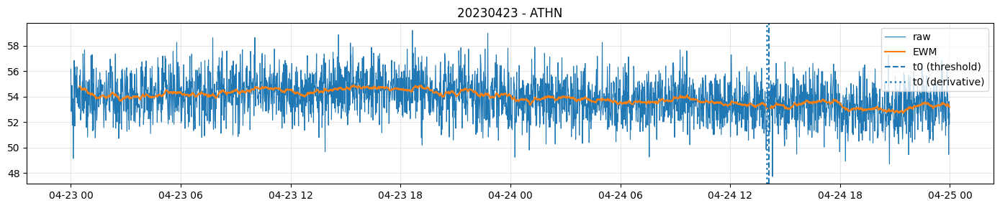

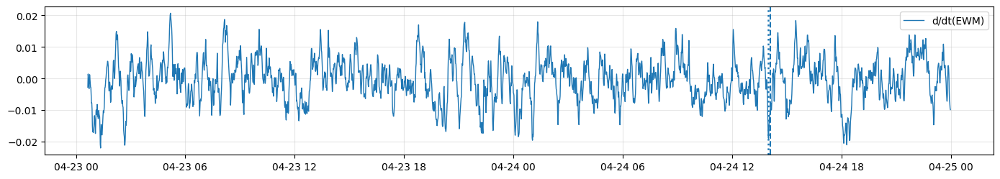

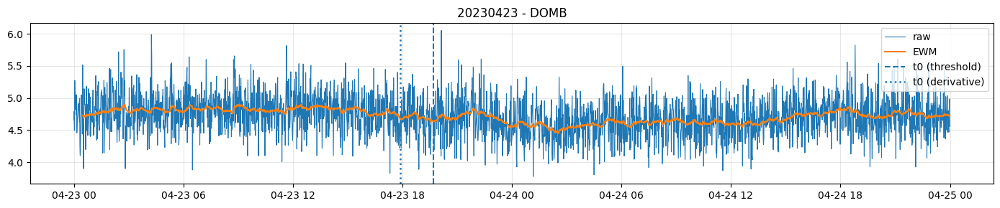

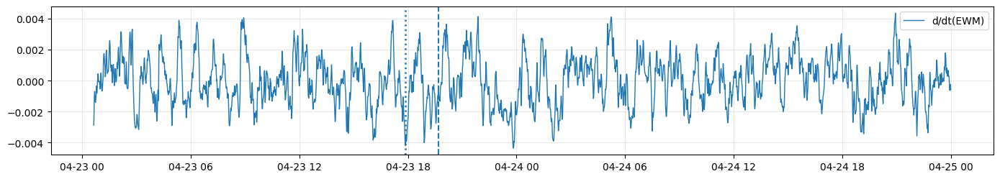

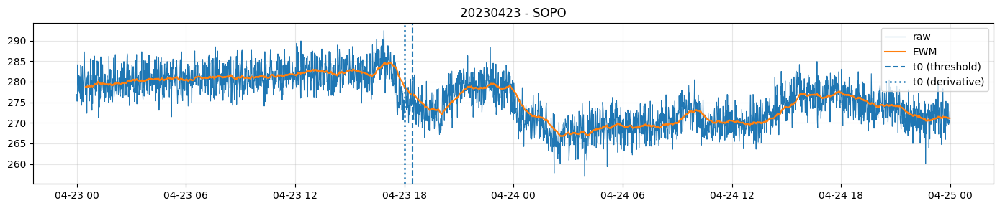

...

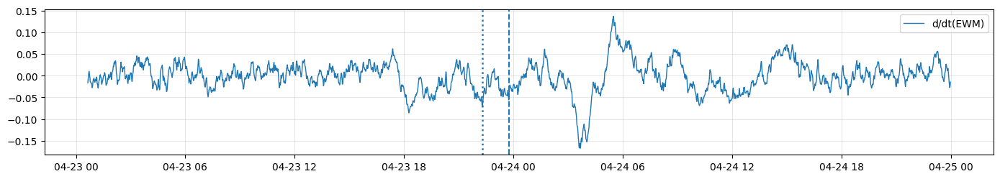

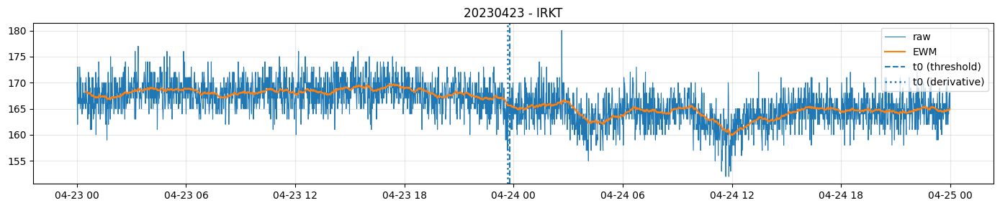

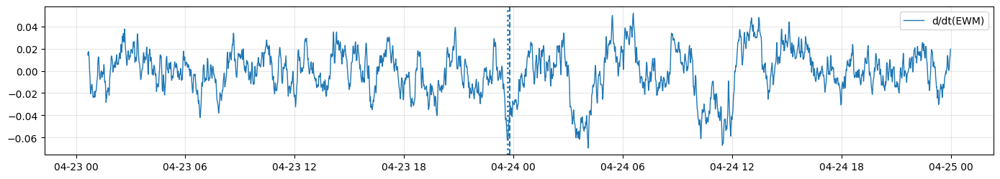

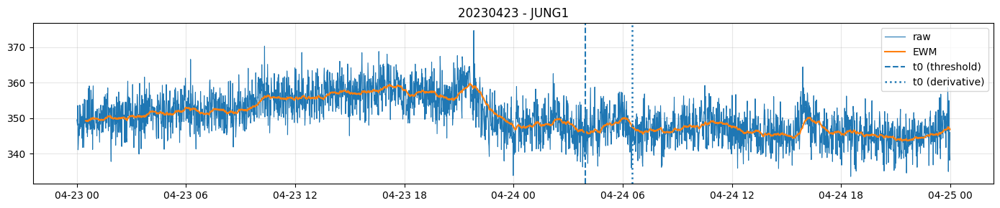

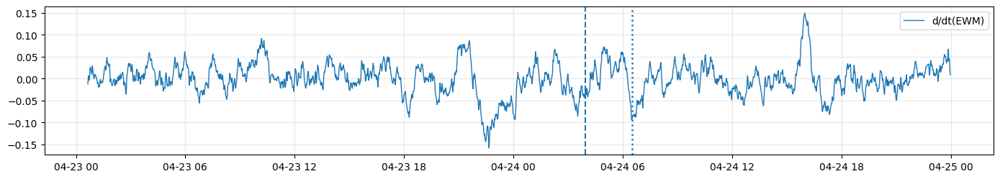

/opt/homebrew/lib/python3.13/site-packages/sklearn/metrics/_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


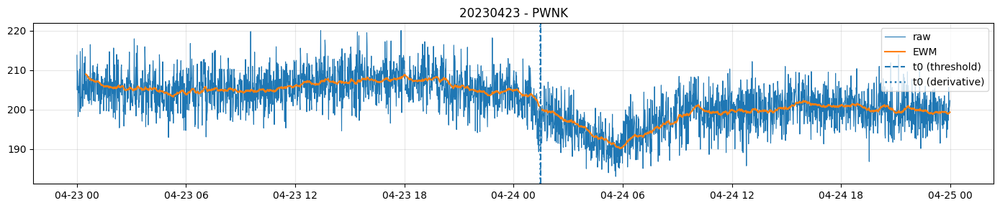

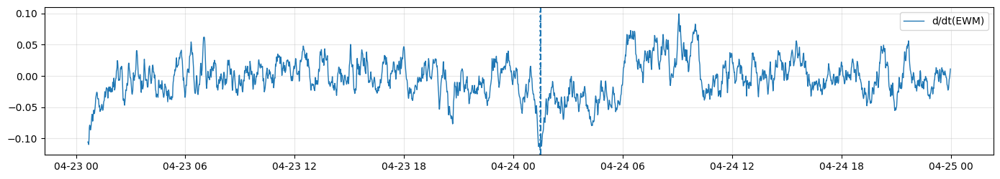

/var/folders/8n/h_rtmhz56bd84hgb5_cp68fc0000gn/T/ipykernel_26999/1320283543.py:150: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  leads_df = pd.concat(leads_all, ignore_index=True) if len(leads_all) else pd.DataFrame()


In [10]:
# Corre cada evento con TODAS las métricas (las defaults en compute_metrics)
t0_20230423, leads_20230423 = run_event(20230423, EVENT_STATIONS[20230423], metric_names=None, window_mode="causal")

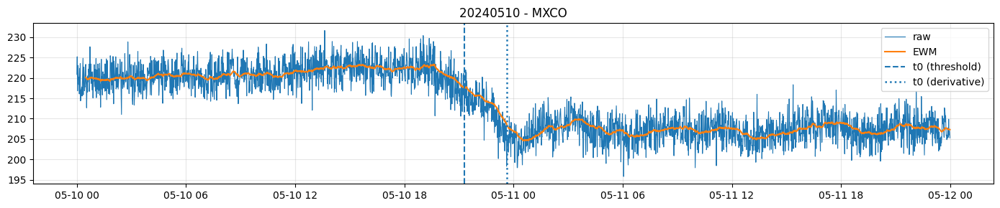

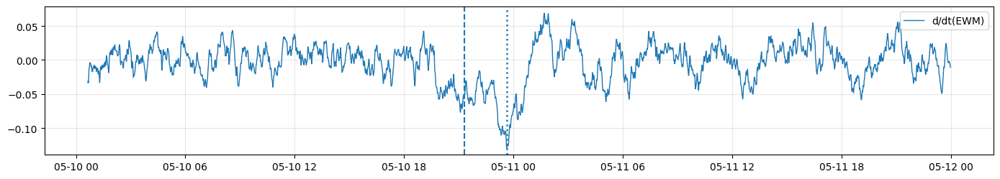

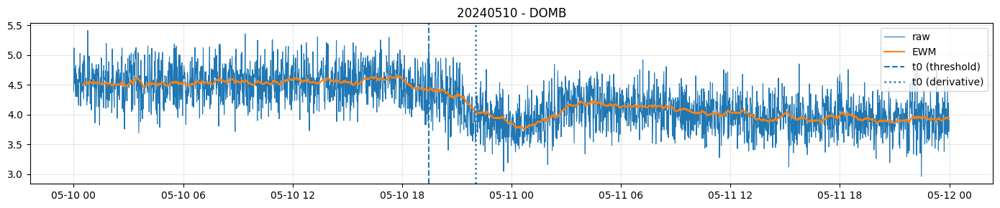

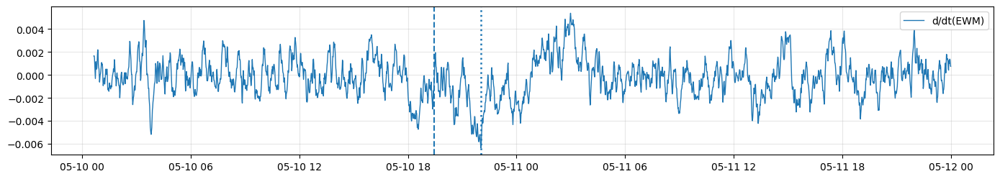

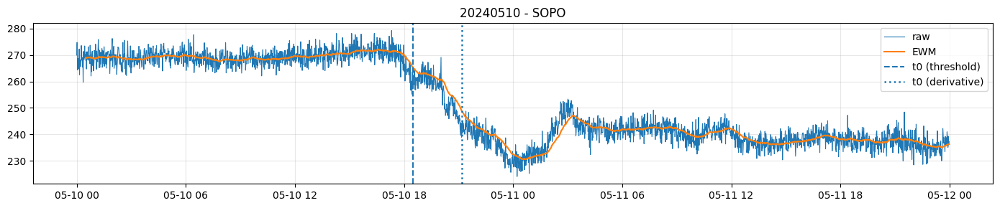

...

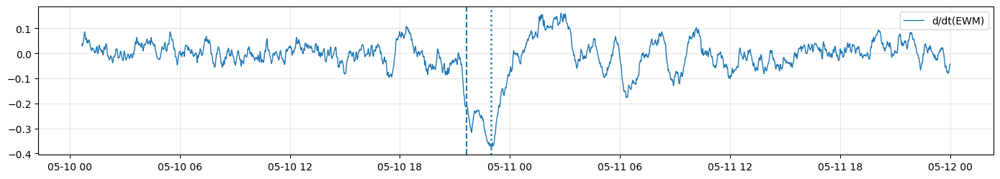

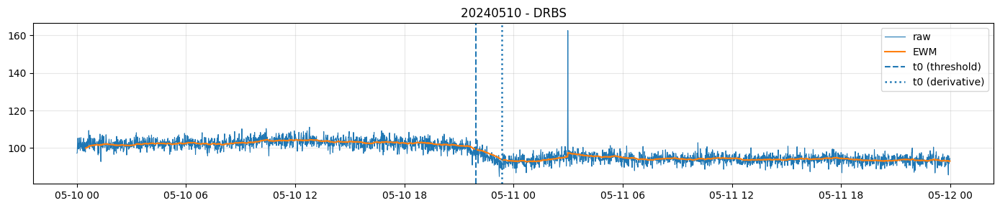

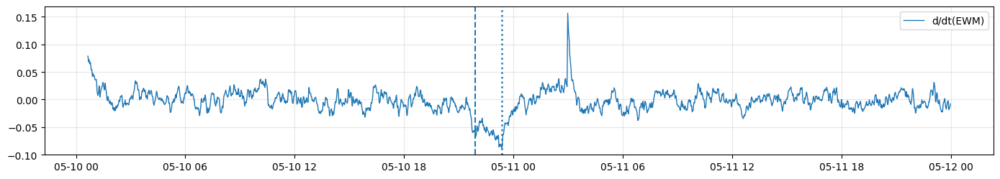

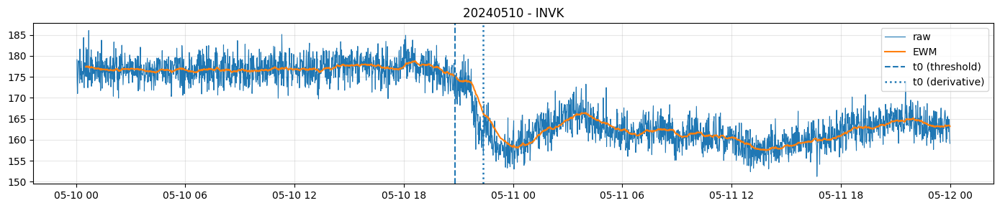

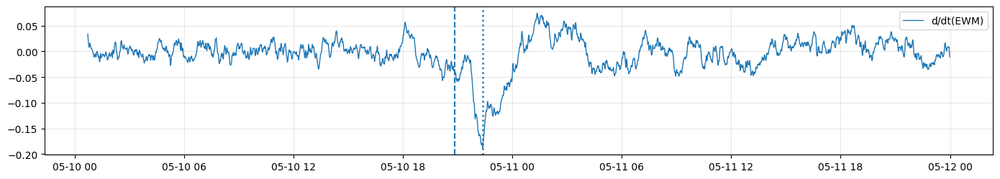

/var/folders/8n/h_rtmhz56bd84hgb5_cp68fc0000gn/T/ipykernel_26999/1320283543.py:150: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  leads_df = pd.concat(leads_all, ignore_index=True) if len(leads_all) else pd.DataFrame()


In [11]:
t0_20240510, leads_20240510 = run_event(20240510, EVENT_STATIONS[20240510], metric_names=None, window_mode="causal")

# QC/Screening report

In [12]:
def screening_report(leads_df: pd.DataFrame, stations: list[str]) -> pd.DataFrame:
    if leads_df.empty:
        return pd.DataFrame()

    # detection per station-metric: lead_min not null
    det = (leads_df.groupby(["metric"])["lead_min"]
                 .apply(lambda s: s.notna().mean())
                 .rename("detection_rate"))

    # lead stats (only where detected)
    stats = (leads_df.dropna(subset=["lead_min"])
                    .groupby("metric")["lead_min"]
                    .agg(lead_med="median",
                         lead_p25=lambda x: np.percentile(x, 25),
                         lead_p75=lambda x: np.percentile(x, 75),
                         n_detect="count"))

    out = pd.concat([det, stats], axis=1).reset_index()

    # Optional: require at least 2 detections to rank meaningfully
    out = out.sort_values(["detection_rate", "n_detect"], ascending=False)
    return out


In [13]:
rep_20230423 = screening_report(leads_20230423, EVENT_STATIONS[20230423])
rep_20230423.to_csv(f"{OUT_DIR}/screening_{20230423}.csv", index=False)

In [14]:
rep_20240510 = screening_report(leads_20240510, EVENT_STATIONS[20240510])
rep_20240510.to_csv(f"{OUT_DIR}/screening_{20240510}.csv", index=False)

# Generar ranking + elegir CORE + preparar figuras

In [18]:
import pandas as pd
import numpy as np

def metric_ranking(leads_df: pd.DataFrame) -> pd.DataFrame:
    g = leads_df.groupby("metric")["lead_min"]
    out = pd.DataFrame({
        "detection_rate": g.apply(lambda s: s.notna().mean()),
        "n_detect": g.apply(lambda s: s.notna().sum()),
        "lead_median_min": g.median(),
        "lead_q25_min": g.quantile(0.25),
        "lead_q75_min": g.quantile(0.75),
    }).reset_index()
    out["lead_IQR_min"] = out["lead_q75_min"] - out["lead_q25_min"]
    return out.sort_values(["detection_rate","n_detect"], ascending=False)

# Cargar tus outputs (si ya corriste con 25 estaciones, apunta a esos CSV)
leads_20230423 = pd.read_csv("Outputs/leads_20230423.csv")
leads_20240510 = pd.read_csv("Outputs/leads_20240510.csv")

rank_23 = metric_ranking(leads_20230423)
rank_10 = metric_ranking(leads_20240510)
rank_all = metric_ranking(pd.concat([leads_20230423, leads_20240510], ignore_index=True))

rank_23.to_csv("Outputs/ranking_20230423.csv", index=False)
rank_10.to_csv("Outputs/ranking_20240510.csv", index=False)
rank_all.to_csv("Outputs/ranking_all.csv", index=False)

CORE = ["higuchi_fd","corr_dim","katz_fd","shannon_entropy","spectral_entropy","sampen","app_entropy"]#,"lepel_ziv"]
pd.DataFrame({"CORE_metrics": CORE}).to_csv("Outputs/panel_CORE_metrics.csv", index=False)


In [19]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

CORE = ["higuchi_fd","corr_dim","katz_fd","shannon_entropy",
        "spectral_entropy","sampen","app_entropy"]#,"lepel_ziv"]

def plot_markers_and_derivatives(
    date: int,
    station: str,
    t0: pd.Timestamp | None = None,
    *,
    # counts preprocessing
    ewm_span: int = 60,
    ewm_minp: int = 30,
    dx_smooth_span: int = 30,
    # marker computation
    W_min: int = 120,
    step_min: int = 5,
    window_mode: str = "causal",
    min_valid_frac: float = 0.90,
    min_len: int = 60,
    do_zscore_window: bool = False,
    params_by_metric: dict[str, dict] | None = None,
    # plotting window around t0
    L_min: int = 480,     # minutes before t0
    post_min: int = 60,   # minutes after t0
    # derivative smoothing for markers
    dM_smooth_span: int = 30,
    # IO
    savepath: str | None = None,
):
    # --- load event + series ---
    df = load_event(date)
    if station not in df.columns:
        raise KeyError(f"Station {station} not found in event {date} columns.")

    x = df[station]
    x_s = ewm_smooth(x, span=ewm_span, min_periods=ewm_minp)
    dx_s = robust_derivative(x_s, smooth_span=dx_smooth_span)

    # --- if t0 not provided, try to read from Outputs/t0_by_station_DATE.csv ---
    if t0 is None:
        try:
            t0_tbl = pd.read_csv(f"Outputs/t0_by_station_{date}.csv")
            row = t0_tbl.loc[t0_tbl["station"] == station].iloc[0]
            t0 = pd.to_datetime(row["t0_threshold"]) if pd.notna(row["t0_threshold"]) else None
        except Exception:
            t0 = None

    if t0 is None:
        raise ValueError("t0 is None. Provide t0 or ensure Outputs/t0_by_station_DATE.csv exists and has it.")

    # --- restrict computation to neighborhood of t0 to keep it fast ---
    t_eval_start = t0 - pd.Timedelta(minutes=L_min)
    t_eval_end   = t0 + pd.Timedelta(minutes=post_min)

    # include extra history so causal windows have enough past
    t_slice_start = t_eval_start - pd.Timedelta(minutes=W_min)
    t_slice_end   = t_eval_end

    x_s_slice = x_s.loc[t_slice_start:t_slice_end].copy()

    # --- compute markers (CORE) ---
    Mk = compute_marker_series(
        x_s_slice,
        metric_names=CORE,
        W_min=W_min,
        step_min=step_min,
        mode=window_mode,
        min_valid_frac=min_valid_frac,
        min_len=min_len,
        do_zscore=do_zscore_window,
        params_by_metric=params_by_metric,
    )

    # keep only eval interval (where we care)
    Mk = Mk.loc[t_eval_start:t_eval_end]

    # --- marker derivatives (gradient + optional smoothing) ---
    dMk = Mk.apply(lambda s: pd.Series(np.gradient(s.values), index=s.index))
    if dM_smooth_span is not None and dM_smooth_span > 1:
        dMk = dMk.apply(lambda s: ewm_smooth(s, span=dM_smooth_span, min_periods=max(5, dM_smooth_span//3)))

    # --- plot: rows = metrics, cols = {Mk, dMk} ---
    n = len(CORE)
    fig, axes = plt.subplots(nrows=n, ncols=2, figsize=(14, 2.0*n), sharex=True)

    if n == 1:
        axes = np.array([axes])  # ensure 2D

    for i, m in enumerate(CORE):
        ax1 = axes[i, 0]
        ax2 = axes[i, 1]

        ax1.plot(Mk.index, Mk[m], lw=1.2)
        ax2.plot(dMk.index, dMk[m], lw=1.2)

        ax1.axvline(t0, ls="--", lw=1.2)
        ax2.axvline(t0, ls="--", lw=1.2)

        ax1.set_ylabel(m)
        if i == 0:
            ax1.set_title("Marker $M_k(t)$")
            ax2.set_title("Derivative $\\dot{M}_k(t)$")

        ax1.grid(alpha=0.25)
        ax2.grid(alpha=0.25)

    fig.suptitle(f"{date} — {station} — CORE markers (step={step_min} min, W={W_min} min, mode={window_mode})", y=0.995)
    plt.tight_layout()

    if savepath is not None:
        plt.savefig(savepath, dpi=300)
    plt.show()

    return Mk, dMk


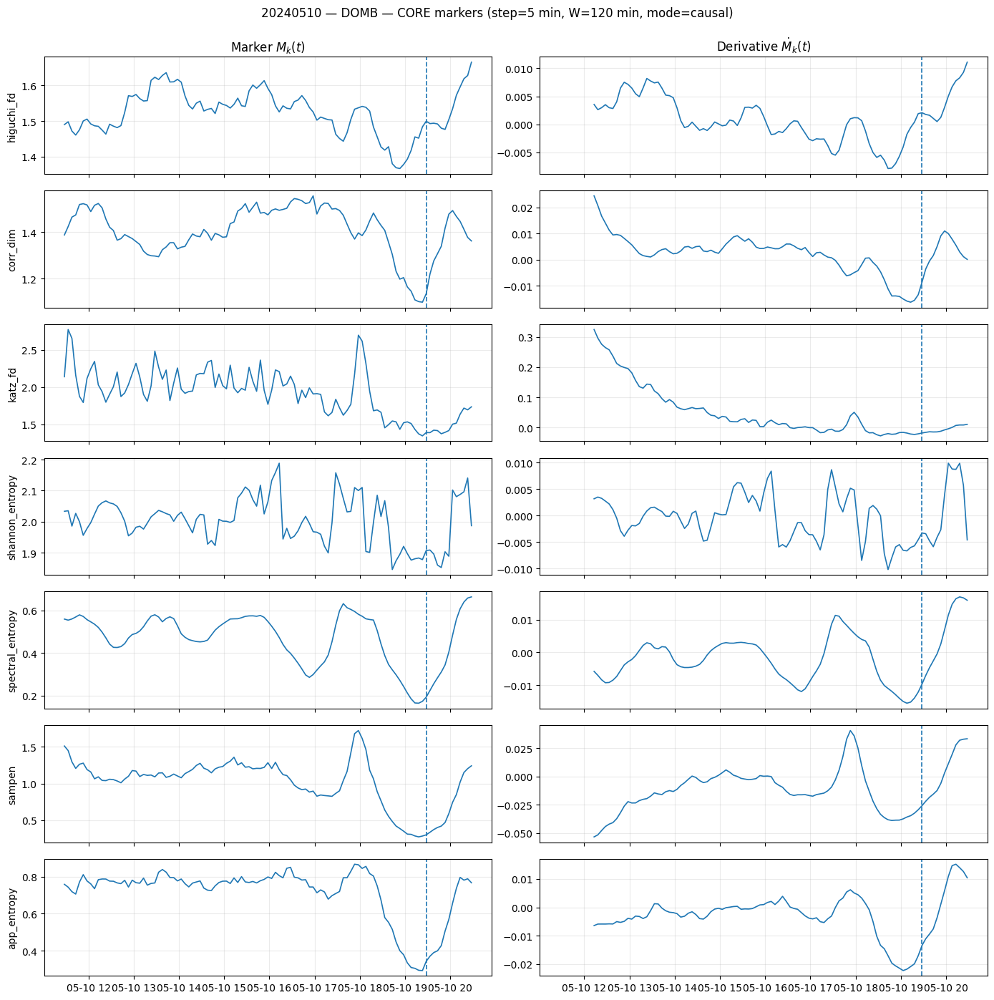

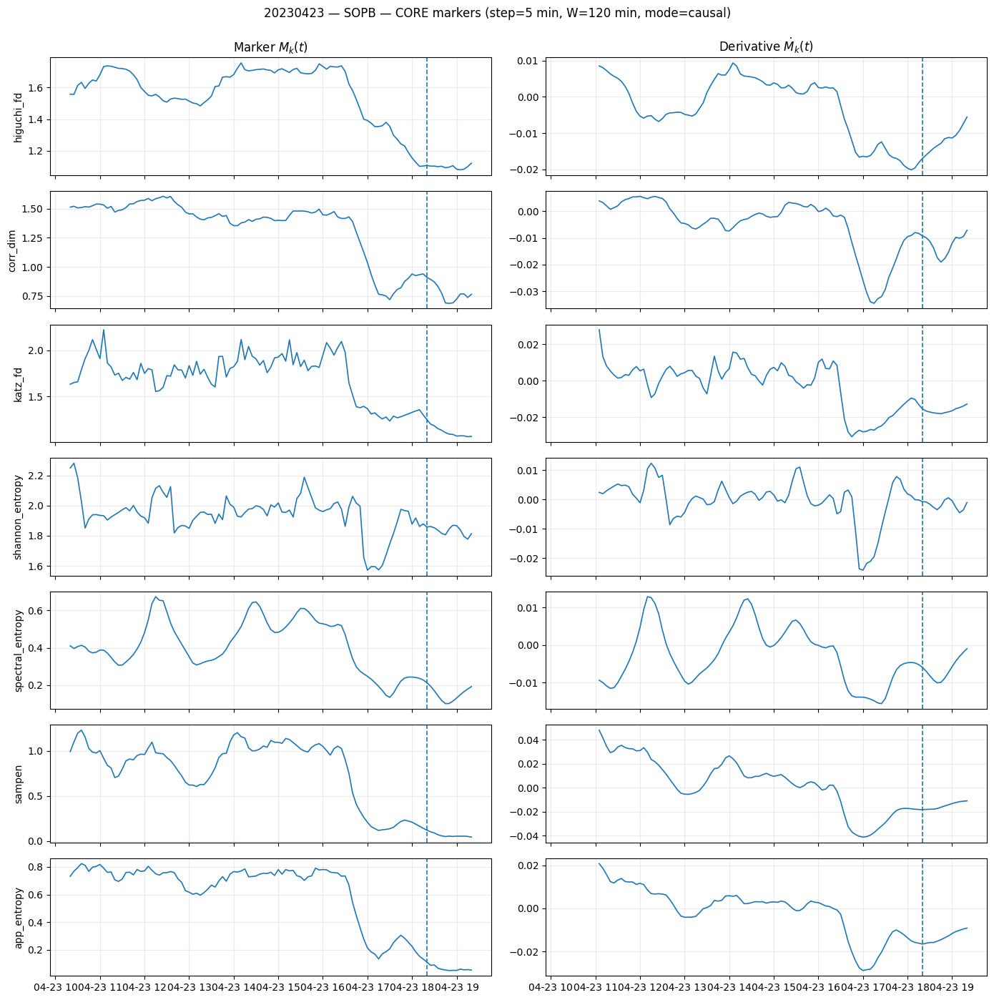

In [20]:
# Ejemplo evento 20240510, estación DOMB
Mk, dMk = plot_markers_and_derivatives(
    20240510, "DOMB",
    savepath="Figures/markers_CORE_20240510_DOMB.png",
)

# Ejemplo evento 20230423, estación SOPB
Mk, dMk = plot_markers_and_derivatives(
    20230423, "SOPB",
    savepath="Figures/markers_CORE_20230423_SOPB.png",
)


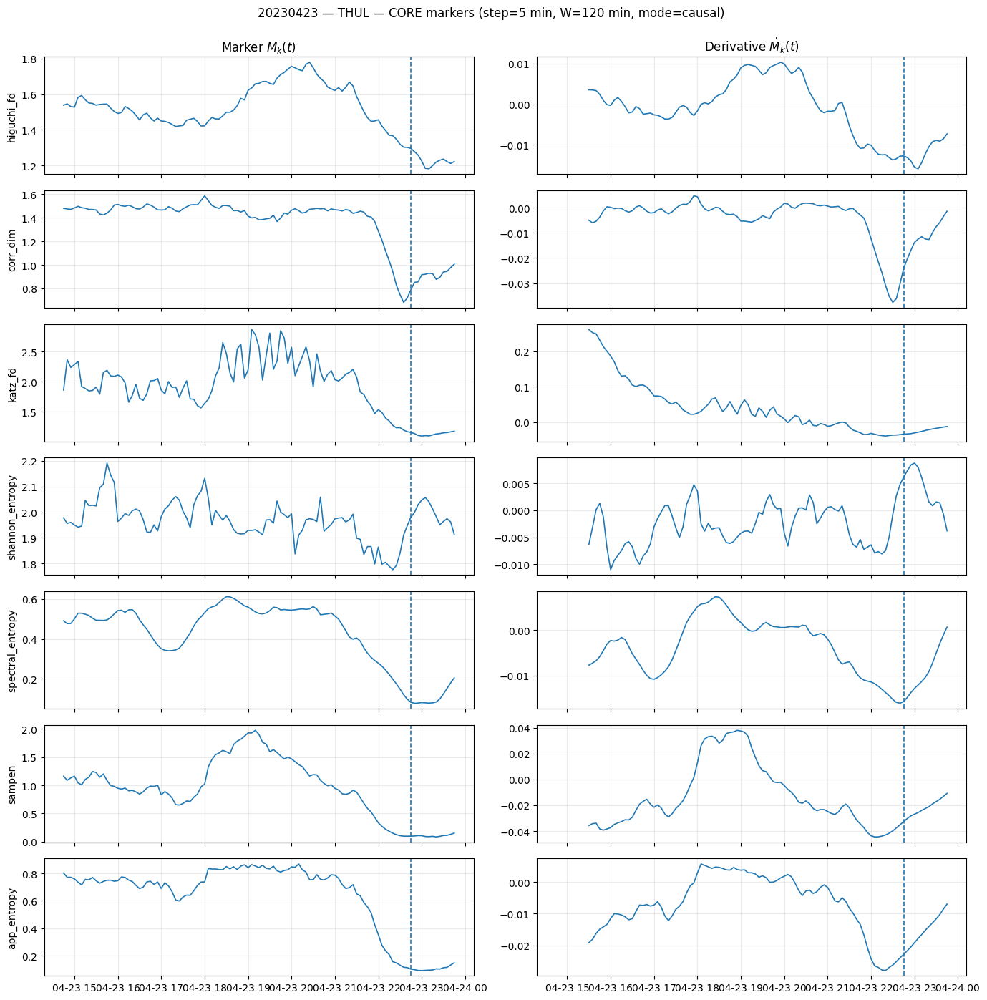

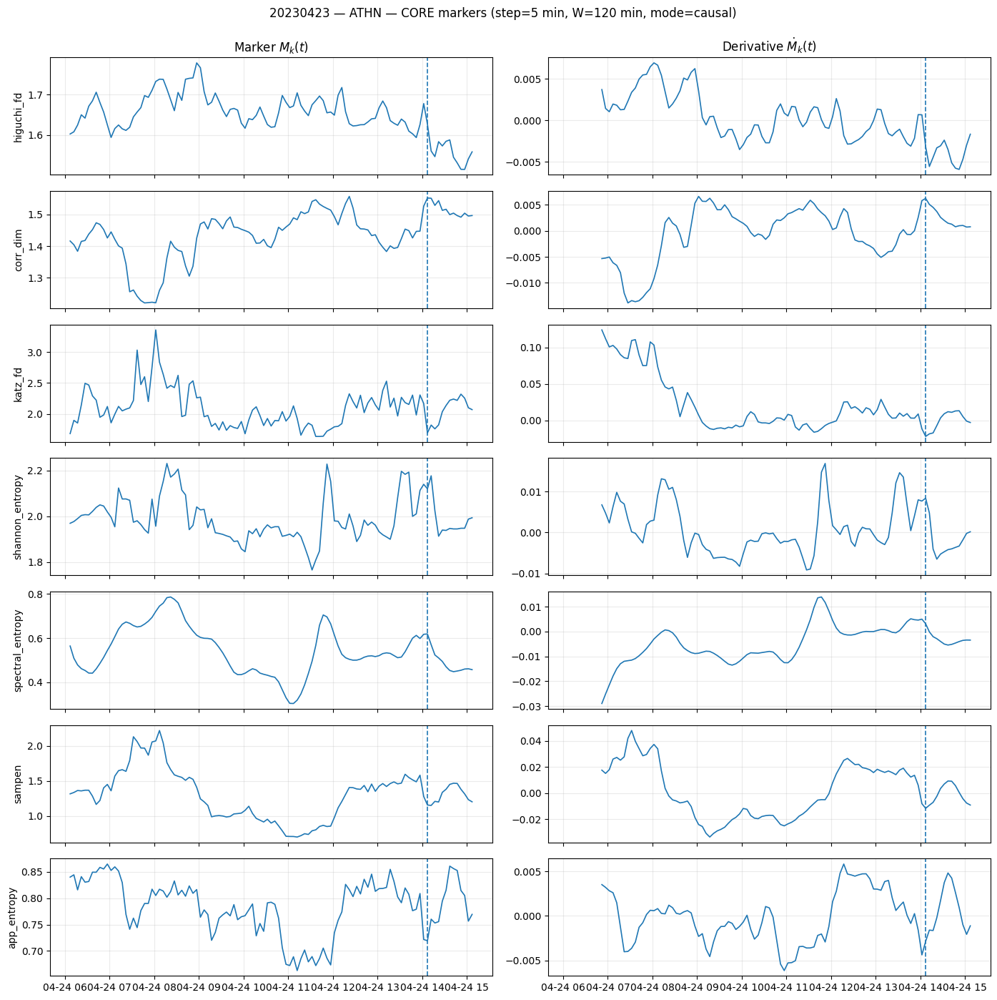

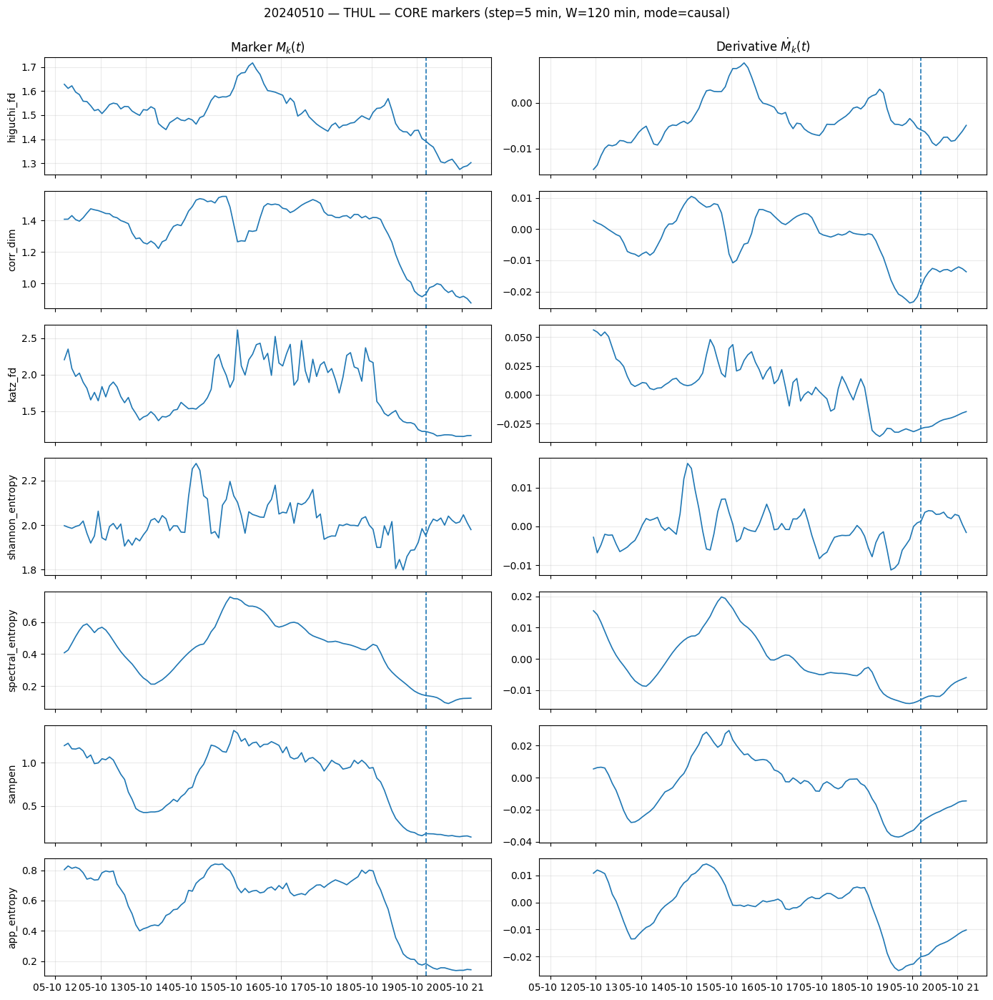

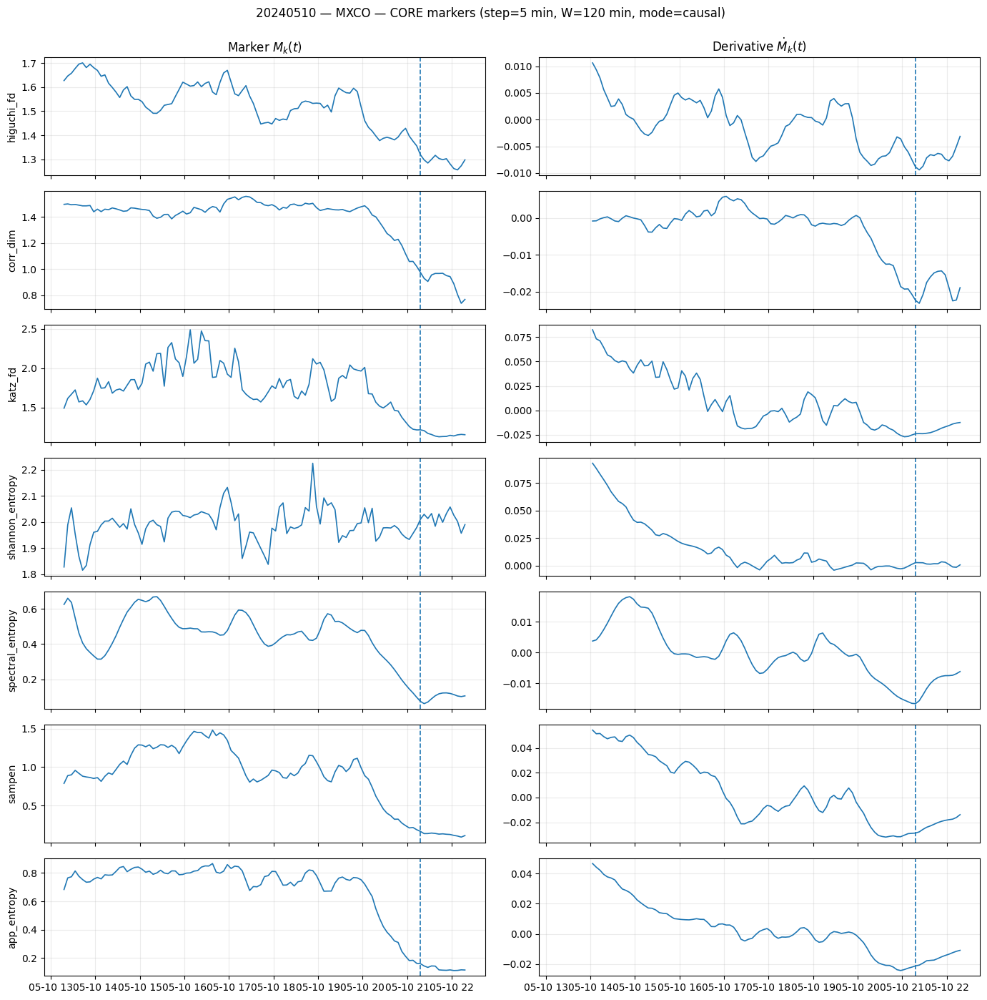

(                     higuchi_fd  corr_dim   katz_fd  shannon_entropy  \
 2024-05-10 13:18:00    1.626823  1.497365  1.491626         1.827625   
 2024-05-10 13:23:00    1.645982  1.500557  1.616544         1.989328   
 2024-05-10 13:28:00    1.657488  1.494282  1.669388         2.054445   
 2024-05-10 13:33:00    1.677138  1.496442  1.723729         1.954456   
 2024-05-10 13:38:00    1.695246  1.491081  1.571730         1.868636   
 ...                         ...       ...       ...              ...   
 2024-05-10 21:58:00    1.281492  0.943530  1.147445         2.057687   
 2024-05-10 22:03:00    1.262247  0.888704  1.139811         2.026221   
 2024-05-10 22:08:00    1.256824  0.806170  1.153488         2.002604   
 2024-05-10 22:13:00    1.273781  0.738484  1.159215         1.957187   
 2024-05-10 22:18:00    1.298485  0.768368  1.155052         1.990168   
 
                      spectral_entropy    sampen  app_entropy  
 2024-05-10 13:18:00          0.624716  0.788005     0.683

In [21]:
plot_markers_and_derivatives(20230423, "THUL", savepath="Figures/markers_CORE_20230423_THUL.png")
plot_markers_and_derivatives(20230423, "ATHN", savepath="Figures/markers_CORE_20230423_ATHN.png")

plot_markers_and_derivatives(20240510, "THUL", savepath="Figures/markers_CORE_20240510_THUL.png")
plot_markers_and_derivatives(20240510, "MXCO", savepath="Figures/markers_CORE_20240510_MXCO.png")


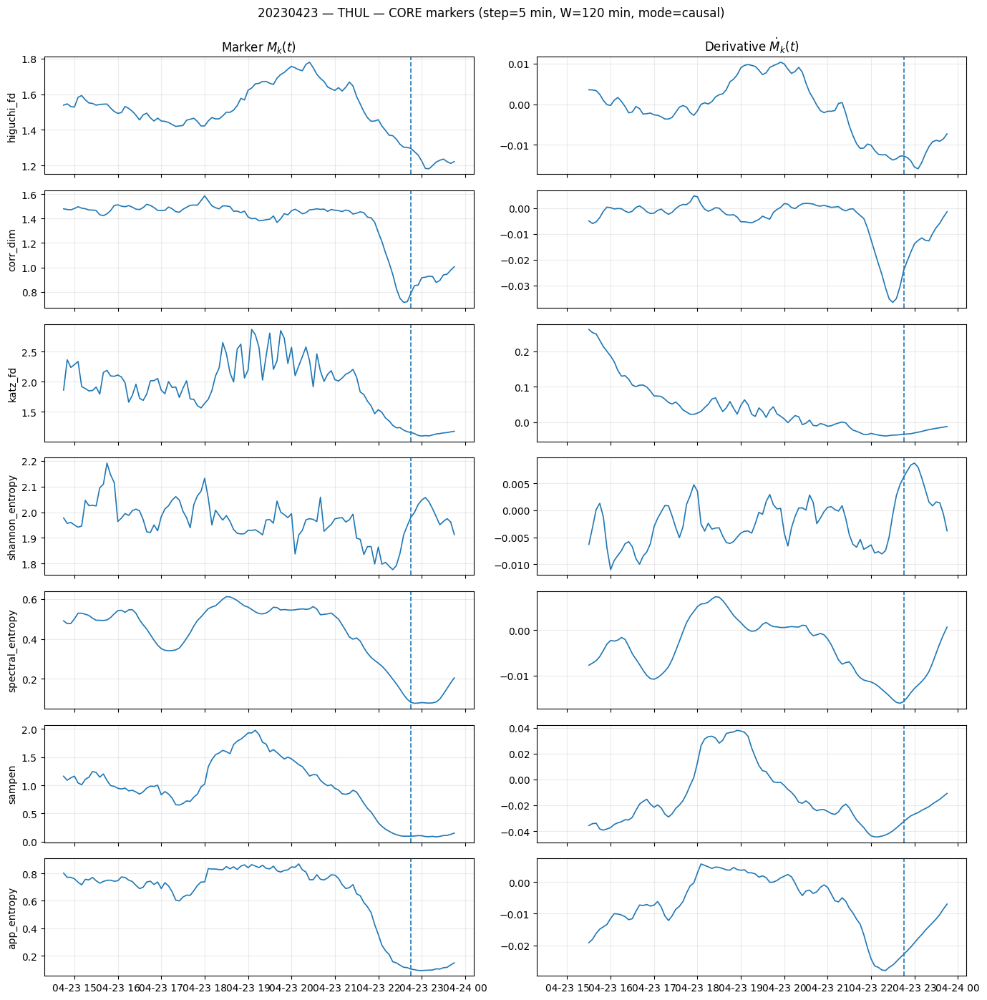

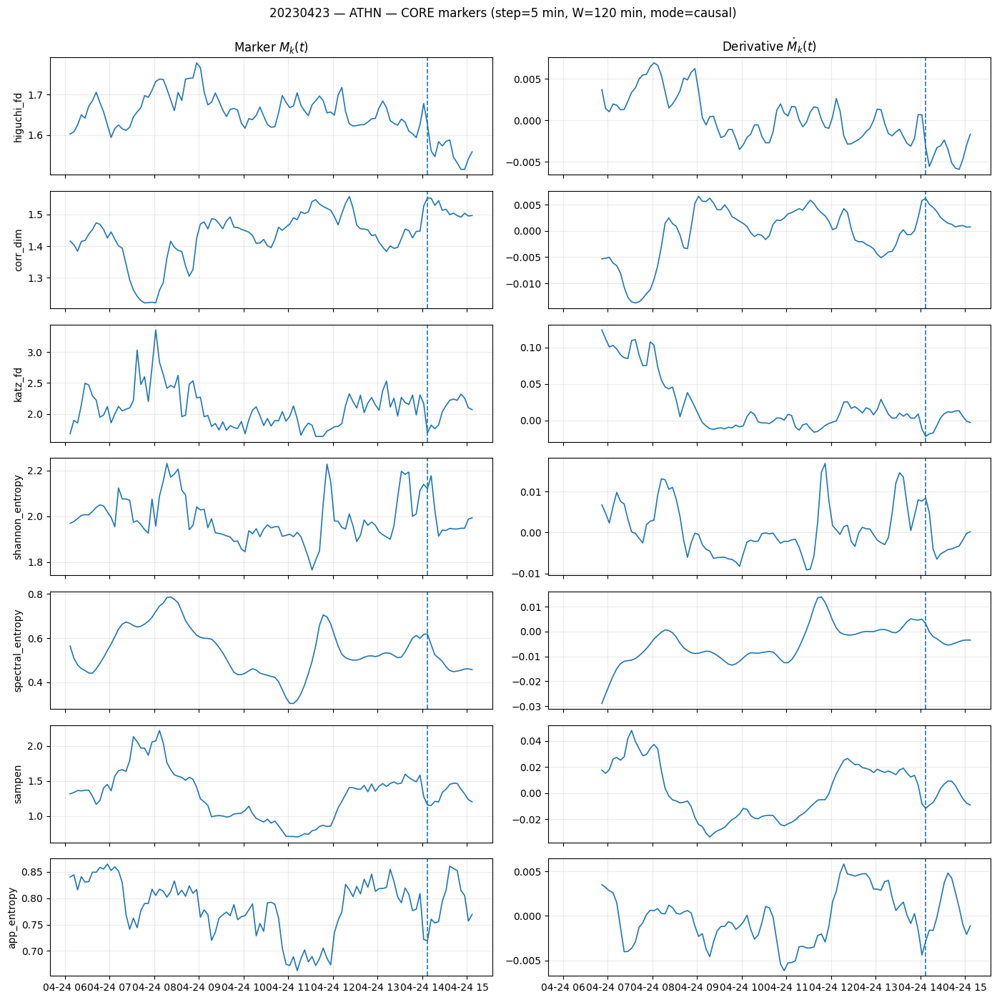

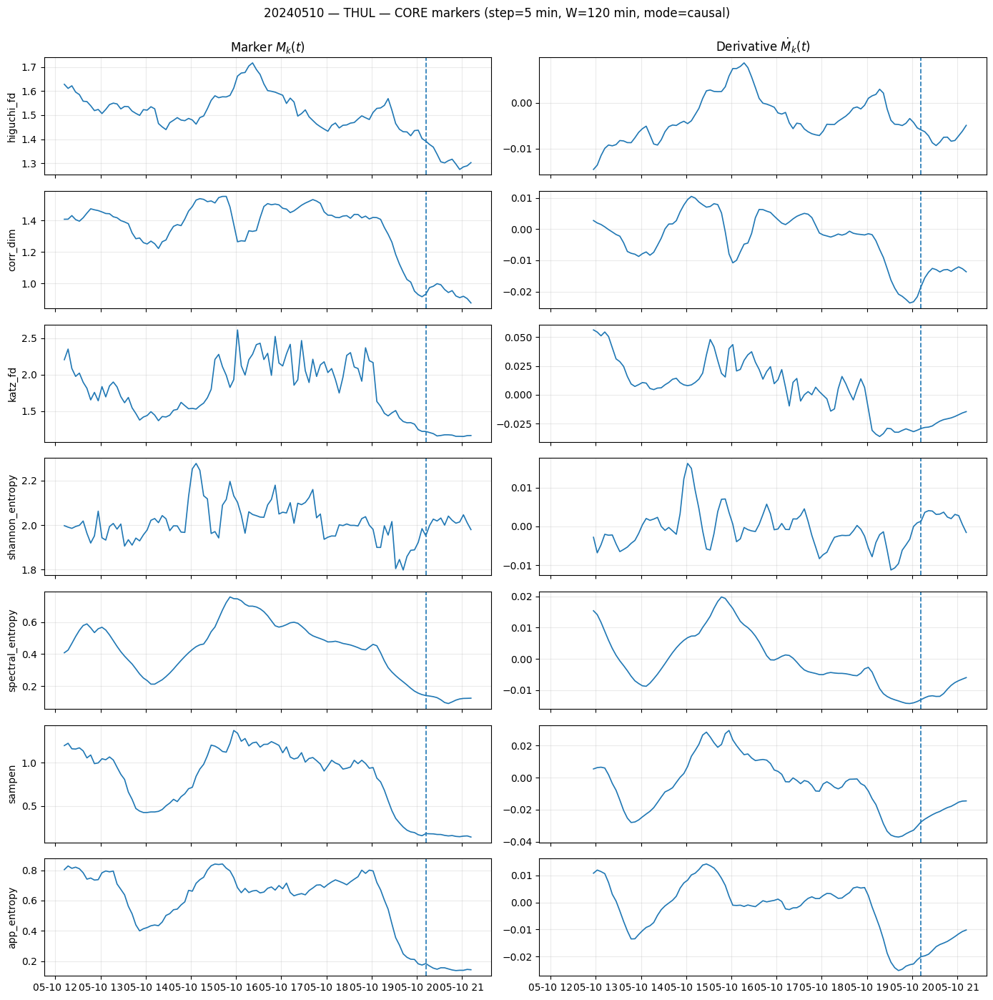

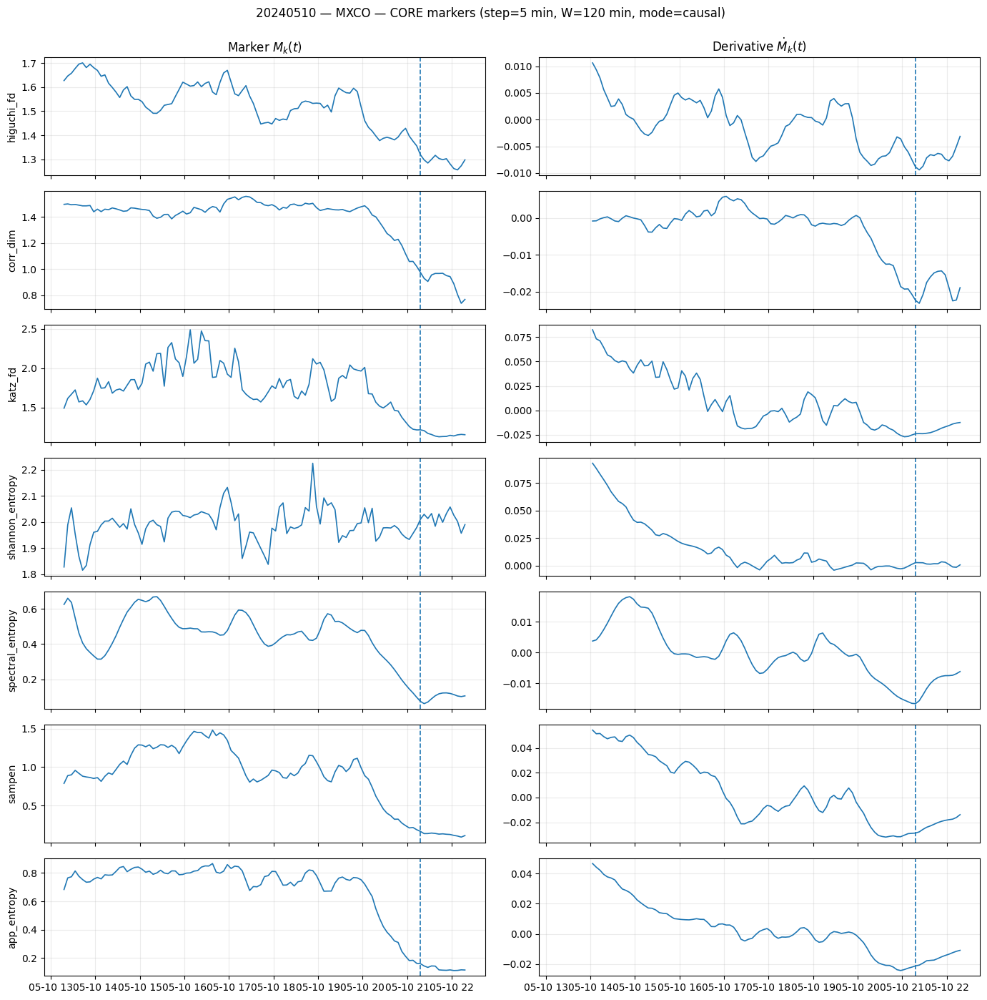

,event,station,status,savepath,n_rows_Mk,n_cols_Mk,error
0,20230423,THUL,ok,Figures/figB_markers_CORE_20230423_THUL.png,109,7,
1,20230423,ATHN,ok,Figures/figB_markers_CORE_20230423_ATHN.png,109,7,
2,20240510,THUL,ok,Figures/figB_markers_CORE_20240510_THUL.png,109,7,
3,20240510,MXCO,ok,Figures/figB_markers_CORE_20240510_MXCO.png,109,7,


In [22]:
import os
import pandas as pd

os.makedirs("Figures", exist_ok=True)
os.makedirs("Outputs", exist_ok=True)

FIG_B_SELECTIONS = {
    20230423: ["THUL", "ATHN"],
    20240510: ["THUL", "MXCO"],
}

def batch_make_core_marker_figures(
    selections: dict[int, list[str]],
    *,
    out_dir: str = "Figures",
    manifest_path: str = "Outputs/figB_manifest.csv",
    # pass-through params to your plot function
    W_min: int = 120,
    step_min: int = 5,
    window_mode: str = "causal",
    L_min: int = 480,
    post_min: int = 60,
):
    rows = []

    for date, stations in selections.items():
        for st in stations:
            savepath = os.path.join(out_dir, f"figB_markers_CORE_{date}_{st}.png")
            try:
                Mk, dMk = plot_markers_and_derivatives(
                    date, st,
                    savepath=savepath,
                    W_min=W_min,
                    step_min=step_min,
                    window_mode=window_mode,
                    L_min=L_min,
                    post_min=post_min,
                )
                rows.append({
                    "event": date,
                    "station": st,
                    "status": "ok",
                    "savepath": savepath,
                    "n_rows_Mk": 0 if Mk is None else len(Mk),
                    "n_cols_Mk": 0 if Mk is None else Mk.shape[1],
                    "error": ""
                })
            except Exception as e:
                rows.append({
                    "event": date,
                    "station": st,
                    "status": "error",
                    "savepath": savepath,
                    "n_rows_Mk": 0,
                    "n_cols_Mk": 0,
                    "error": repr(e)
                })
                print(f"[ERROR] {date} {st}: {e}")

    manifest = pd.DataFrame(rows)
    manifest.to_csv(manifest_path, index=False)
    return manifest

# Run
manifest = batch_make_core_marker_figures(FIG_B_SELECTIONS)
manifest


# Bloque R1 — Consolidar leads + ranking final (ambos eventos)

In [23]:
import pandas as pd
import numpy as np

leads_23 = pd.read_csv("Outputs/leads_20230423.csv")
leads_10 = pd.read_csv("Outputs/leads_20240510.csv")

leads_all = pd.concat([leads_23, leads_10], ignore_index=True)
leads_all.to_csv("Outputs/leads_all.csv", index=False)

def metric_ranking(df):
    g = df.groupby("metric")["lead_min"]
    out = pd.DataFrame({
        "detection_rate": g.apply(lambda s: s.notna().mean()),
        "n_detect": g.apply(lambda s: s.notna().sum()),
        "lead_median_min": g.median(),
        "lead_q25_min": g.quantile(0.25),
        "lead_q75_min": g.quantile(0.75),
    }).reset_index()
    out["lead_IQR_min"] = out["lead_q75_min"] - out["lead_q25_min"]
    return out.sort_values(["detection_rate","n_detect"], ascending=False)

rank_all = metric_ranking(leads_all)
rank_all.to_csv("Outputs/ranking_all.csv", index=False)

rank_by_event = (leads_all.groupby("event", as_index=False)
                 .apply(metric_ranking)
                 .reset_index(drop=True))
rank_by_event.to_csv("Outputs/ranking_by_event.csv", index=False)

rank_all.head(12)


/var/folders/8n/h_rtmhz56bd84hgb5_cp68fc0000gn/T/ipykernel_26999/4158650210.py:26: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(metric_ranking)


,metric,detection_rate,n_detect,lead_median_min,lead_q25_min,lead_q75_min,lead_IQR_min
3,entropy,0.945455,52,-458.0,-460.00,-456.00,4.00
12,shannon_entropy,0.927273,51,-300.0,-401.00,-196.50,204.50
0,app_entropy,0.909091,50,-203.0,-308.50,-111.50,197.00
4,higuchi_fd,0.872727,48,-296.0,-367.75,-192.25,175.50
1,corr_dim,0.854545,47,-227.0,-340.00,-119.00,221.00
11,sampen,0.854545,47,-273.0,-388.50,-170.00,218.50
13,spectral_entropy,0.836364,46,-365.5,-424.75,-271.50,153.25
7,lepel_ziv,0.818182,45,-320.0,-432.00,-245.00,187.00
10,petrosian_fd,0.800000,44,-261.0,-360.25,-162.50,197.75
6,katz_fd,0.781818,43,-305.0,-407.50,-125.50,282.00


# Bloque R2 — Seleccionar panel CORE desde el ranking (semi-automático)

In [24]:
# ejemplo: top 10 por detection, excluye entropy y cosas con 0 detect
bad = {"entropy", "dfa", "mfhurst_b"}  # ajustable
candidates = rank_all[~rank_all["metric"].isin(bad)].copy()

CORE_auto = candidates.head(8)["metric"].tolist()
pd.DataFrame({"CORE_auto": CORE_auto}).to_csv("Outputs/CORE_auto.csv", index=False)
CORE_auto


['shannon_entropy',
 'app_entropy',
 'higuchi_fd',
 'corr_dim',
 'sampen',
 'spectral_entropy',
 'lepel_ziv',
 'petrosian_fd']

# Bloque R3 — Figura extra opcional “paper-ready”: barras de detection_rate (CORE)

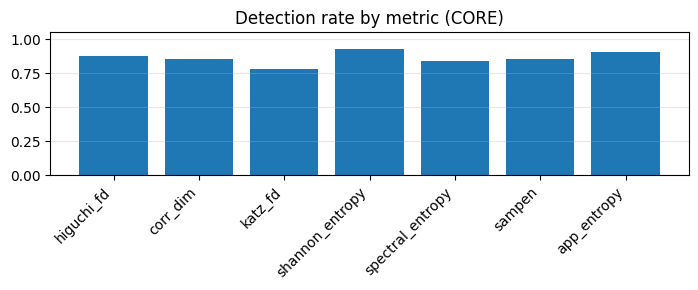

In [25]:
import matplotlib.pyplot as plt

core = CORE  # o CORE_auto
sub = rank_all.set_index("metric").loc[core].reset_index()

plt.figure(figsize=(7,3))
plt.bar(sub["metric"], sub["detection_rate"])
plt.xticks(rotation=45, ha="right")
plt.ylim(0, 1.05)
plt.grid(alpha=0.3, axis="y")
plt.title("Detection rate by metric (CORE)")
plt.tight_layout()
plt.savefig("Figures/core_detection_rate.png", dpi=300)
plt.show()


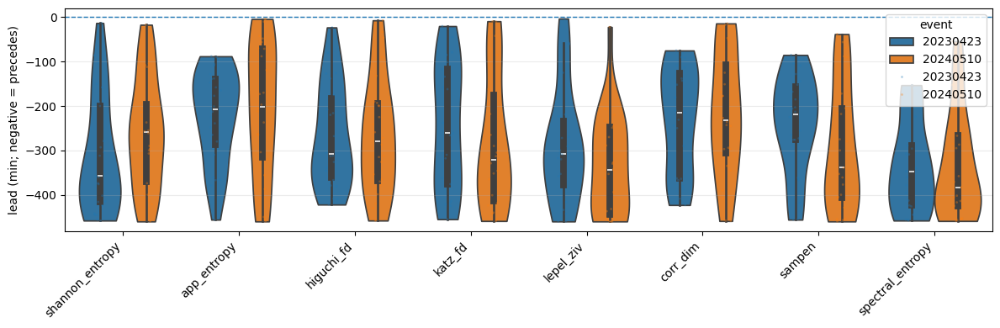

In [26]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

CORE = ["higuchi_fd","corr_dim","katz_fd","shannon_entropy",
        "spectral_entropy","sampen","lepel_ziv","app_entropy"]

leads_23 = pd.read_csv("Outputs/leads_20230423.csv")
leads_10 = pd.read_csv("Outputs/leads_20240510.csv")
df = pd.concat([leads_23, leads_10], ignore_index=True)

df = df[df["metric"].isin(CORE)].copy()
df = df.dropna(subset=["lead_min"])
df["event"] = df["event"].astype(str)

plt.figure(figsize=(12,4))
sns.violinplot(data=df, x="metric", y="lead_min", hue="event", cut=0, inner="box", dodge=True)
sns.stripplot(data=df, x="metric", y="lead_min", hue="event", dodge=True, alpha=0.35, size=2)

plt.axhline(0, ls="--", lw=1)
plt.xticks(rotation=45, ha="right")
plt.ylabel("lead (min; negative = precedes)")
plt.xlabel("")
plt.grid(alpha=0.25, axis="y")
plt.tight_layout()
plt.savefig("Figures/violin_CORE_by_event.png", dpi=300)
plt.show()


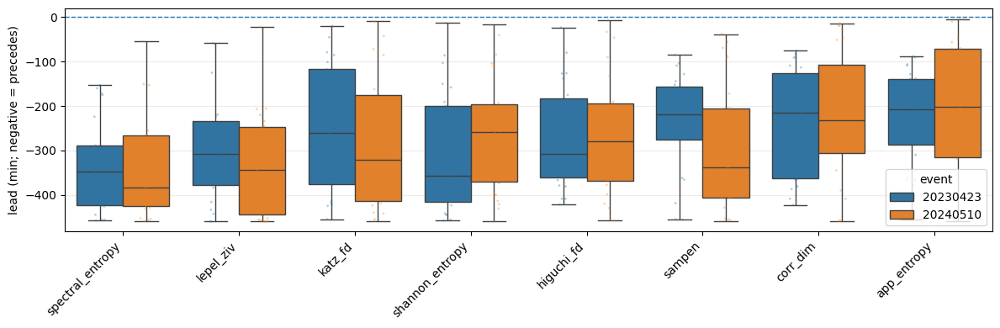

In [27]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

CORE = ["higuchi_fd","corr_dim","katz_fd","shannon_entropy",
        "spectral_entropy","sampen","lepel_ziv","app_entropy"]

# Load
leads_23 = pd.read_csv("Outputs/leads_20230423.csv")
leads_10 = pd.read_csv("Outputs/leads_20240510.csv")
df = pd.concat([leads_23, leads_10], ignore_index=True)

# Filter
df = df[df["metric"].isin(CORE)].copy()
df = df.dropna(subset=["lead_min"])
df["event"] = df["event"].astype(str)

# Order metrics by pooled median lead (more negative first)
order = (df.groupby("metric")["lead_min"].median()
           .sort_values()
           .index.tolist())

plt.figure(figsize=(12, 4))

ax = sns.boxplot(
    data=df, x="metric", y="lead_min", hue="event",
    order=order, dodge=True, fliersize=0
)

# overlay points
sns.stripplot(
    data=df, x="metric", y="lead_min", hue="event",
    order=order, dodge=True, alpha=0.35, size=2, ax=ax
)

# clean legend (remove duplicates)
handles, labels = ax.get_legend_handles_labels()
# first half corresponds to boxplot, second half to stripplot (same labels)
n = len(set(labels))
ax.legend(handles[:n], labels[:n], title="event", loc="lower right", frameon=True)

ax.axhline(0, ls="--", lw=1)
ax.set_ylabel("lead (min; negative = precedes)")
ax.set_xlabel("")
ax.grid(alpha=0.25, axis="y")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()

plt.savefig("Figures/fig4_core_lead_boxpoints.png", dpi=300)
plt.show()


In [28]:
import pandas as pd
import numpy as np

CORE = ["higuchi_fd","corr_dim","katz_fd","shannon_entropy",
        "spectral_entropy","sampen","lepel_ziv","app_entropy"]

# Cargar leads de los 2 eventos que conservaste
leads_23 = pd.read_csv("Outputs/leads_20230423.csv")
leads_10 = pd.read_csv("Outputs/leads_20240510.csv")
leads_all = pd.concat([leads_23, leads_10], ignore_index=True)

# Filtrar CORE y detecciones válidas
df = leads_all[leads_all["metric"].isin(CORE)].copy()

def core_ranking_table(df):
    g_all = df.groupby("metric")["lead_min"]
    det_rate = g_all.apply(lambda s: s.notna().mean())
    n_detect = g_all.apply(lambda s: s.notna().sum())

    g = df.dropna(subset=["lead_min"]).groupby("metric")["lead_min"]
    med = g.median()
    q25 = g.quantile(0.25)
    q75 = g.quantile(0.75)
    iqr = q75 - q25

    out = pd.DataFrame({
        "metric": det_rate.index,
        "detection_rate": det_rate.values,
        "n_detect": n_detect.values,
        "lead_median_min": med.reindex(det_rate.index).values,
        "lead_IQR_min": iqr.reindex(det_rate.index).values,
        "lead_q25_min": q25.reindex(det_rate.index).values,
        "lead_q75_min": q75.reindex(det_rate.index).values,
    })

    # Orden: más detección primero; luego mediana más negativa (más anticipación)
    out = out.sort_values(
        ["detection_rate", "n_detect", "lead_median_min"],
        ascending=[False, False, True]
    )
    return out

tab = core_ranking_table(df)

# Versión redondeada para paper
tab_paper = tab.copy()
tab_paper["detection_rate"] = (100 * tab_paper["detection_rate"]).round(1)  # %
for c in ["lead_median_min", "lead_IQR_min", "lead_q25_min", "lead_q75_min"]:
    tab_paper[c] = tab_paper[c].round(1)

# Renombrar columnas (bonito)
tab_paper = tab_paper.rename(columns={
    "metric": "Invariant",
    "detection_rate": "Detect (%)",
    "n_detect": "N",
    "lead_median_min": "Median lead (min)",
    "lead_IQR_min": "IQR (min)",
    "lead_q25_min": "Q25",
    "lead_q75_min": "Q75",
})

# Guardar CSV
tab_paper.to_csv("Outputs/table1_core_ranking.csv", index=False)

# Export LaTeX (booktabs)
latex = tab_paper.to_latex(
    index=False,
    escape=True,
    column_format="lrrrrrr",
    float_format="%.1f",
    caption=("CORE-panel station-wise lead statistics pooled across the two events "
             "(negative lead = precedes onset)."),
    label="tab:core_ranking",
    longtable=False,
    bold_rows=False
)

with open("Outputs/table1_core_ranking.tex", "w") as f:
    f.write(latex)

tab_paper


,Invariant,Detect (%),N,Median lead (min),IQR (min),Q25,Q75
6,shannon_entropy,92.7,51,-300.0,204.5,-401.0,-196.5
0,app_entropy,90.9,50,-203.0,197.0,-308.5,-111.5
2,higuchi_fd,87.3,48,-296.0,175.5,-367.8,-192.2
5,sampen,85.5,47,-273.0,218.5,-388.5,-170.0
1,corr_dim,85.5,47,-227.0,221.0,-340.0,-119.0
7,spectral_entropy,83.6,46,-365.5,153.2,-424.8,-271.5
4,lepel_ziv,81.8,45,-320.0,187.0,-432.0,-245.0
3,katz_fd,78.2,43,-305.0,282.0,-407.5,-125.5


In [29]:
import pandas as pd
import numpy as np

CORE = ["higuchi_fd","corr_dim","katz_fd","shannon_entropy",
        "spectral_entropy","sampen","lepel_ziv","app_entropy"]

leads_23 = pd.read_csv("Outputs/leads_20230423.csv")
leads_10 = pd.read_csv("Outputs/leads_20240510.csv")
df = pd.concat([leads_23, leads_10], ignore_index=True)

df = df[df["metric"].isin(CORE)].copy()
df["event"] = df["event"].astype(str)

def core_ranking_table(df_sub):
    g_all = df_sub.groupby("metric")["lead_min"]
    det_rate = g_all.apply(lambda s: s.notna().mean())
    n_detect = g_all.apply(lambda s: s.notna().sum())

    g = df_sub.dropna(subset=["lead_min"]).groupby("metric")["lead_min"]
    med = g.median()
    q25 = g.quantile(0.25)
    q75 = g.quantile(0.75)
    iqr = q75 - q25

    out = pd.DataFrame({
        "metric": det_rate.index,
        "detection_rate": det_rate.values,
        "n_detect": n_detect.values,
        "lead_median_min": med.reindex(det_rate.index).values,
        "lead_IQR_min": iqr.reindex(det_rate.index).values,
    }).sort_values(["detection_rate","n_detect","lead_median_min"],
                   ascending=[False, False, True])
    return out

rows = []
for ev, dfe in df.groupby("event"):
    tab = core_ranking_table(dfe)
    tab["event"] = ev
    rows.append(tab)

tab2 = pd.concat(rows, ignore_index=True)

# Pretty
tab2_paper = tab2.copy()
tab2_paper["detection_rate"] = (100 * tab2_paper["detection_rate"]).round(1)
tab2_paper["lead_median_min"] = tab2_paper["lead_median_min"].round(1)
tab2_paper["lead_IQR_min"] = tab2_paper["lead_IQR_min"].round(1)

tab2_paper = tab2_paper.rename(columns={
    "event": "Event",
    "metric": "Invariant",
    "detection_rate": "Detect (%)",
    "n_detect": "N",
    "lead_median_min": "Median lead (min)",
    "lead_IQR_min": "IQR (min)",
})

tab2_paper.to_csv("Outputs/table2_core_by_event.csv", index=False)

latex2 = tab2_paper.to_latex(
    index=False,
    escape=True,
    column_format="l l r r r r",
    caption=("CORE-panel station-wise lead statistics reported separately for each event "
             "(negative lead = precedes onset)."),
    label="tab:core_by_event",
)

with open("Outputs/table2_core_by_event.tex", "w") as f:
    f.write(latex2)

tab2_paper


,Invariant,Detect (%),N,Median lead (min),IQR (min),Event
0,shannon_entropy,92.6,25,-358.0,216.0,20230423
1,app_entropy,88.9,24,-207.0,148.8,20230423
2,corr_dim,85.2,23,-215.0,238.0,20230423
3,higuchi_fd,81.5,22,-308.5,178.5,20230423
4,lepel_ziv,81.5,22,-308.0,142.8,20230423
5,sampen,81.5,22,-219.0,120.0,20230423
6,spectral_entropy,77.8,21,-347.0,135.0,20230423
7,katz_fd,77.8,21,-261.0,259.0,20230423
8,higuchi_fd,92.9,26,-279.5,174.2,20240510
9,shannon_entropy,92.9,26,-259.0,175.0,20240510


# BLOQUE F1 — Figuras diagnóstico de t0(counts + derivative)

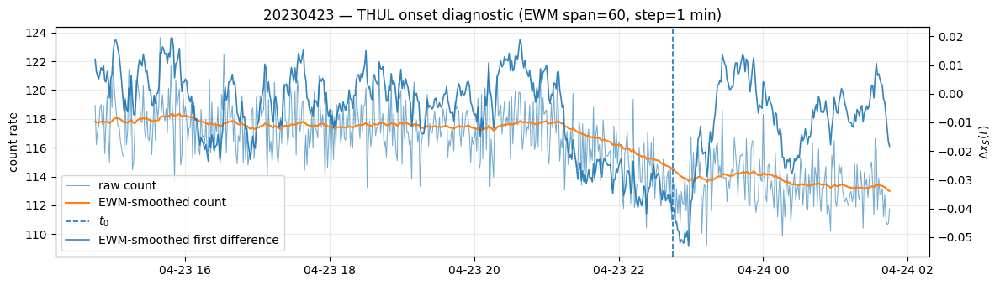

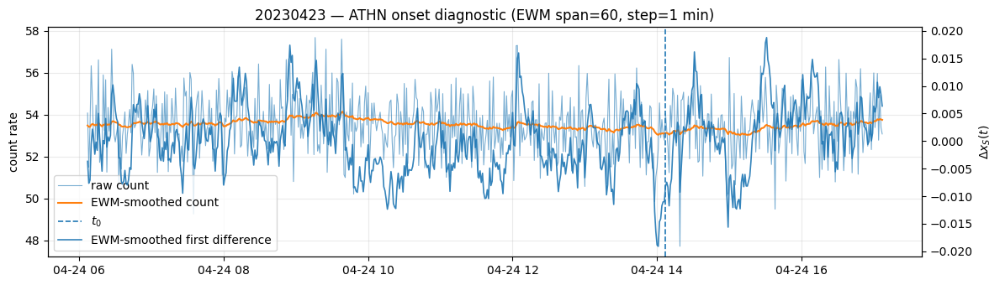

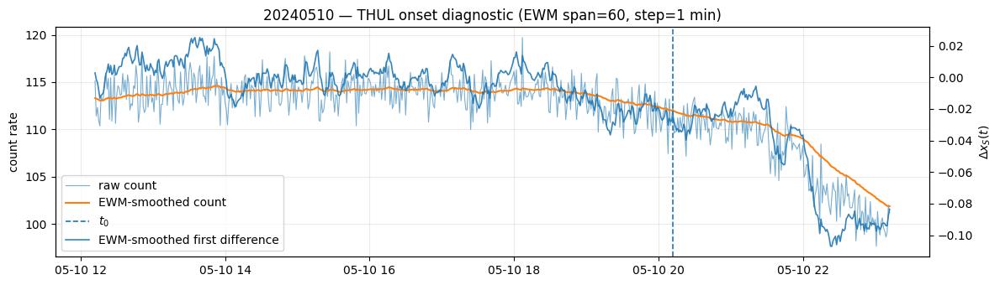

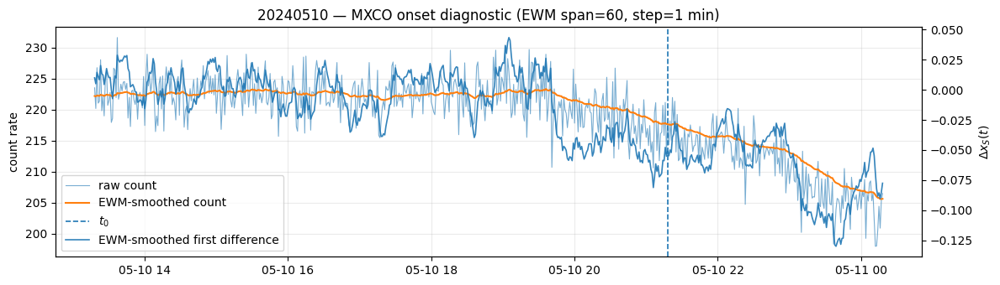

In [30]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

os.makedirs("Figures", exist_ok=True)

# --- util: load event data (ajusta si tu función load_event ya existe) ---
def load_event(date: int, data_dir: str = "Datas") -> pd.DataFrame:
    path = os.path.join(data_dir, f"all{date}.txt")
    df = pd.read_csv(path, delimiter=";")
    df = df.replace("   null", np.nan)
    df["DATETIME"] = pd.to_datetime(df["DATETIME"])
    df = df.set_index("DATETIME")
    df.index.name = None
    return df

def ewm_smooth(s: pd.Series, span: int = 60, min_periods: int = 30) -> pd.Series:
    return s.astype(float).ewm(span=span, adjust=False, min_periods=min_periods).mean()

def robust_derivative(s: pd.Series, smooth_span: int = 30) -> pd.Series:
    ds = s.diff()
    ds = ds.ewm(span=smooth_span, adjust=False, min_periods=max(5, smooth_span//3)).mean()
    return ds

def read_t0(date: int, station: str, out_dir: str = "Outputs") -> pd.Timestamp:
    t0_tbl = pd.read_csv(os.path.join(out_dir, f"t0_by_station_{date}.csv"))
    row = t0_tbl.loc[t0_tbl["station"] == station].iloc[0]
    t0 = pd.to_datetime(row["t0_threshold"])
    return t0

def plot_onset_diagnostic(
    date: int,
    station: str,
    *,
    ewm_span: int = 60,
    ewm_minp: int = 30,
    d_smooth_span: int = 30,
    L_min: int = 480,
    post_min: int = 180,
    data_dir: str = "Datas",
    out_dir: str = "Outputs",
    savepath: str | None = None,
):
    df = load_event(date, data_dir=data_dir)
    if station not in df.columns:
        raise KeyError(f"{station} not found in event {date}.")

    x = df[station].astype(float)
    x_s = ewm_smooth(x, span=ewm_span, min_periods=ewm_minp)
    dx_s = robust_derivative(x_s, smooth_span=d_smooth_span)

    t0 = read_t0(date, station, out_dir=out_dir)

    tL = t0 - pd.Timedelta(minutes=L_min)
    tR = t0 + pd.Timedelta(minutes=post_min)

    # crop
    x_c = x.loc[tL:tR]
    x_s_c = x_s.loc[tL:tR]
    dx_c = dx_s.loc[tL:tR]

    fig, ax1 = plt.subplots(figsize=(12, 3.5))
    ax1.plot(x_c.index, x_c.values, lw=0.8, alpha=0.6, label="raw count")
    ax1.plot(x_s_c.index, x_s_c.values, lw=1.5, label="EWM-smoothed count")
    ax1.axvline(t0, ls="--", lw=1.2, label=r"$t_0$")

    ax1.set_ylabel("count rate")
    ax1.grid(alpha=0.25)

    ax2 = ax1.twinx()
    ax2.plot(dx_c.index, dx_c.values, lw=1.2, alpha=0.9, label="EWM-smoothed first difference")
    ax2.set_ylabel(r"$\Delta x_S(t)$")

    # merge legends
    h1, l1 = ax1.get_legend_handles_labels()
    h2, l2 = ax2.get_legend_handles_labels()
    ax1.legend(h1 + h2, l1 + l2, loc="lower left", frameon=True)

    ax1.set_title(f"{date} — {station} onset diagnostic (EWM span={ewm_span}, step=1 min)")
    plt.tight_layout()

    if savepath is not None:
        plt.savefig(savepath, dpi=300)
    plt.show()

    return t0

# ---- Batch: 4 representative stations ----
ONSET_SELECTIONS = {
    20230423: ["THUL", "ATHN"],
    20240510: ["THUL", "MXCO"],
}

for date, sts in ONSET_SELECTIONS.items():
    for st in sts:
        savepath = f"Figures/fig1_onset_diagnostic_{date}_{st}.png"
        plot_onset_diagnostic(date, st, savepath=savepath)


# BLOQUE F3 — Fig. 3 “lag distributions” (2 eventos)
- Dos opciones: (A) todas las métricas, o (B) solo CORE

## (A) Fig. 3 con todas las métricas

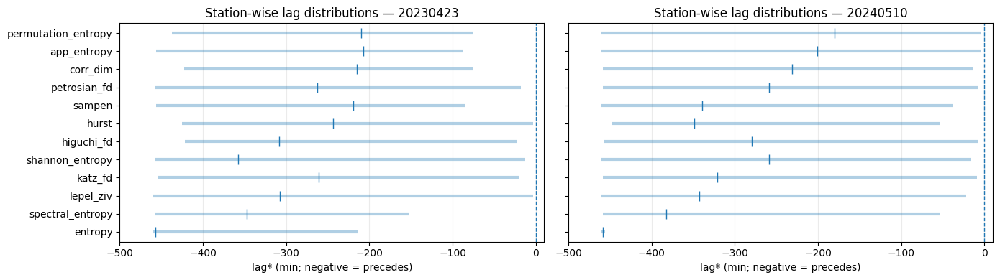

In [33]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

os.makedirs("Figures", exist_ok=True)

def make_lag_distribution_figure(
    leads_paths: dict[int, str],
    *,
    savepath: str = "Figures/fig3_lag_distributions_allmetrics.png",
    xlim: tuple[int,int] = (-500, 10),
):
    # load
    dfs = []
    for ev, p in leads_paths.items():
        d = pd.read_csv(p)
        d["event"] = str(ev)
        dfs.append(d)
    df = pd.concat(dfs, ignore_index=True)

    # keep valid
    df = df.dropna(subset=["lead_min"]).copy()

    # metric order: by pooled median (more negative first)
    order = (df.groupby("metric")["lead_min"].median()
               .sort_values()
               .index.tolist())

    events = list(leads_paths.keys())
    n = len(events)

    fig, axes = plt.subplots(1, n, figsize=(7*n, 4), sharey=True)
    if n == 1:
        axes = [axes]

    for ax, ev in zip(axes, events):
        dfe = df[df["event"] == str(ev)]
        y = np.arange(len(order))

        # interval = [min, max], marker = median
        mins = dfe.groupby("metric")["lead_min"].min().reindex(order)
        maxs = dfe.groupby("metric")["lead_min"].max().reindex(order)
        meds = dfe.groupby("metric")["lead_min"].median().reindex(order)

        ax.hlines(y, mins.values, maxs.values, lw=3, alpha=0.35)
        ax.plot(meds.values, y, marker="|", linestyle="None", markersize=10)

        ax.axvline(0, ls="--", lw=1)
        ax.set_title(f"Station-wise lag distributions — {ev}")
        ax.set_xlim(*xlim)
        ax.grid(alpha=0.25, axis="x")
        ax.set_xlabel("lag* (min; negative = precedes)")
        ax.set_yticks(y)
        ax.set_yticklabels(order)

    plt.tight_layout()
    plt.savefig(savepath, dpi=300)
    plt.show()

# Run (ajusta paths si tus leads están en otro folder)
leads_paths = {
    20230423: "Outputs/leads_20230423.csv",
    20240510: "Outputs/leads_20240510.csv",
}
make_lag_distribution_figure(leads_paths, savepath="Figures/fig3_lag_distributions_allmetrics.png")


## (B) Fig. 3 solo CORE (más compacta)

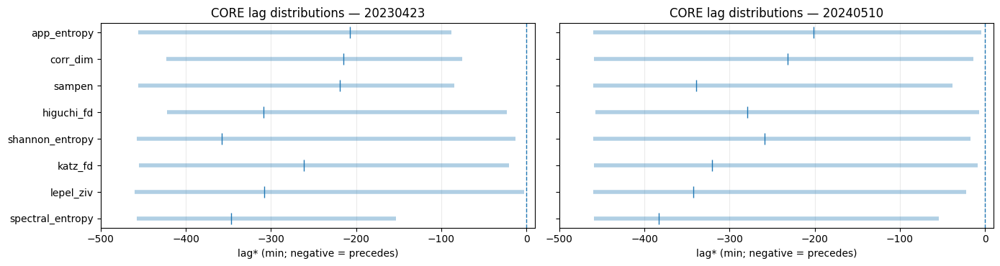

In [35]:
CORE = ["higuchi_fd","corr_dim","katz_fd","shannon_entropy",
        "spectral_entropy","sampen","lepel_ziv","app_entropy"]

def make_lag_distribution_figure_core(
    leads_paths: dict[int, str],
    *,
    savepath: str = "Figures/fig3_lag_distributions_CORE.png",
    xlim: tuple[int,int] = (-500, 10),
):
    dfs = []
    for ev, p in leads_paths.items():
        d = pd.read_csv(p)
        d["event"] = str(ev)
        dfs.append(d)
    df = pd.concat(dfs, ignore_index=True)

    df = df[df["metric"].isin(CORE)].dropna(subset=["lead_min"]).copy()
    order = (df.groupby("metric")["lead_min"].median()
               .sort_values()
               .index.tolist())

    events = list(leads_paths.keys())
    fig, axes = plt.subplots(1, len(events), figsize=(7*len(events), 3.8), sharey=True)
    if len(events) == 1:
        axes = [axes]

    for ax, ev in zip(axes, events):
        dfe = df[df["event"] == str(ev)]
        y = np.arange(len(order))

        mins = dfe.groupby("metric")["lead_min"].min().reindex(order)
        maxs = dfe.groupby("metric")["lead_min"].max().reindex(order)
        meds = dfe.groupby("metric")["lead_min"].median().reindex(order)

        ax.hlines(y, mins.values, maxs.values, lw=4, alpha=0.35)
        ax.plot(meds.values, y, marker="|", linestyle="None", markersize=12)
        ax.axvline(0, ls="--", lw=1)

        ax.set_title(f"CORE lag distributions — {ev}")
        ax.set_xlim(*xlim)
        ax.grid(alpha=0.25, axis="x")
        ax.set_xlabel("lag* (min; negative = precedes)")
        ax.set_yticks(y)
        ax.set_yticklabels(order)

    plt.tight_layout()
    plt.savefig(savepath, dpi=300)
    plt.show()

make_lag_distribution_figure_core(leads_paths, savepath="Figures/fig3_lag_distributions_CORE.png")

# Código limpio para regenerar figuras

In [42]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------
# Config
# -------------------------
DATA_DIR = "Datas"
FIG_DIR  = "Figures"

CORE = [
    "spectral_entropy", "lepel_ziv", "katz_fd", "shannon_entropy",
    "higuchi_fd", "sampen", "corr_dim", "app_entropy"
]

# -------------------------
# IO helpers
# -------------------------
def load_event_counts(date: int) -> pd.DataFrame:
    df = pd.read_csv(f"{DATA_DIR}/all{date}.txt", delimiter=";")
    df = df.replace("   null", np.nan)
    df["DATETIME"] = pd.to_datetime(df["DATETIME"])
    df = df.set_index("DATETIME")
    df.index.name = None
    return df

def read_leads(date: int) -> pd.DataFrame:
    return pd.read_csv(f"leads_{date}.csv")

def read_t0(date: int) -> pd.DataFrame:
    return pd.read_csv(f"t0_by_station_{date}.csv")

# -------------------------
# Onset diagnostic (Fig 1)
# -------------------------
def ewm_smooth(s: pd.Series, span: int = 60) -> pd.Series:
    return s.ewm(span=span, adjust=False).mean()

def onset_t0_from_ewm_diff(x: pd.Series, span: int = 60) -> tuple[pd.Timestamp, pd.Series, pd.Series]:
    xs = ewm_smooth(x, span=span)
    dxs = xs.diff()
    t0 = dxs.idxmin()
    return t0, xs, dxs

def plot_onset_diagnostic(date: int, station: str, span: int = 60, save: bool = True):
    df = load_event_counts(date)
    x = df[station].astype(float).dropna()

    t0, xs, dxs = onset_t0_from_ewm_diff(x, span=span)

    fig, ax = plt.subplots(figsize=(12, 4))
    ax.plot(x.index, x.values, lw=1, alpha=0.5, label="raw count")
    ax.plot(xs.index, xs.values, lw=2, label="EWM-smoothed count")
    ax.axvline(t0, ls="--", lw=2, label=r"$t_0$")

    ax.set_ylabel("count rate", fontsize=22)
    ax.grid(alpha=0.3)

    ax2 = ax.twinx()
    ax2.plot(dxs.index, dxs.values, lw=2, alpha=0.9, label="EWM-smoothed first difference")
    ax2.set_ylabel(r"$\Delta x_S(t)$", fontsize=18)

    # merge legends
    h1, l1 = ax.get_legend_handles_labels()
    h2, l2 = ax2.get_legend_handles_labels()
    ax.legend(h1 + h2, l1 + l2, loc="lower left", framealpha=0.9, fontsize=22)

    ax.set_title(f"{date} — {station} onset diagnostic (EWM span={span})")

    if save:
        out = f"{FIG_DIR}/fig1_onset_diagnostic_{date}_{station}.png"
        fig.savefig(out, dpi=220, bbox_inches="tight")
    plt.show()

# -------------------------
# Fig 3 — lag distributions (IQR bar + median tick)
# expects a "leads_DATE.csv" with columns: Event, station, invariant, lead_min (or similar)
# -------------------------
def summarize_lags(leads: pd.DataFrame, inv_col="invariant", lead_col="lead_min"):
    g = leads.groupby(inv_col)[lead_col]
    out = g.agg(
        N="count",
        median="median",
        q25=lambda s: np.nanquantile(s, 0.25),
        q75=lambda s: np.nanquantile(s, 0.75),
    ).reset_index()
    out["iqr"] = out["q75"] - out["q25"]
    return out

def plot_lag_distributions_two_events(date_a: int, date_b: int, core_only=True, save=True):
    la = read_leads(date_a)
    lb = read_leads(date_b)
    la["Event"] = str(date_a)
    lb["Event"] = str(date_b)
    leads = pd.concat([la, lb], ignore_index=True)

    if core_only:
        leads = leads[leads["invariant"].isin(CORE)].copy()

    fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)
    for ax, date in zip(axes, [str(date_a), str(date_b)]):
        sub = leads[leads["Event"] == date]
        summ = summarize_lags(sub).set_index("invariant").loc[CORE].reset_index()

        y = np.arange(len(summ))
        ax.hlines(y, summ["q25"], summ["q75"], lw=6, alpha=0.25)
        ax.vlines(summ["median"], y - 0.15, y + 0.15, lw=2)
        ax.axvline(0, ls="--", lw=1)

        ax.set_yticks(y)
        ax.set_yticklabels(summ["invariant"])
        ax.invert_yaxis()
        ax.set_xlabel(r"lag$^*$ (min; negative = precedes)")
        ax.set_title(f"CORE lag distributions — {date}")
        ax.grid(axis="x", alpha=0.3)

    plt.tight_layout()
    if save:
        out = f"{FIG_DIR}/fig3_lag_distributions_CORE.png" if core_only else f"{FIG_DIR}/fig3_lag_distributions_allmetrics.png"
        plt.savefig(out, dpi=220, bbox_inches="tight")
    plt.show()

# -------------------------
# Fig 4 — boxplots + points (two events overlaid)
# -------------------------
def plot_core_boxpoints(date_a: int, date_b: int, save=True):
    la = read_leads(date_a); la["event"] = str(date_a)
    lb = read_leads(date_b); lb["event"] = str(date_b)
    leads = pd.concat([la, lb], ignore_index=True)
    leads = leads[leads["invariant"].isin(CORE)].copy()

    fig, ax = plt.subplots(figsize=(14, 5))

    # Prepare data in CORE order
    dataA = [leads[(leads["event"]==str(date_a)) & (leads["invariant"]==m)]["lead_min"].dropna().values for m in CORE]
    dataB = [leads[(leads["event"]==str(date_b)) & (leads["invariant"]==m)]["lead_min"].dropna().values for m in CORE]

    pos = np.arange(len(CORE))
    ax.boxplot(dataA, positions=pos-0.18, widths=0.32, patch_artist=True)
    ax.boxplot(dataB, positions=pos+0.18, widths=0.32, patch_artist=True)

    # scatter points
    for i, m in enumerate(CORE):
        xa = np.random.normal(pos[i]-0.18, 0.03, size=len(dataA[i]))
        xb = np.random.normal(pos[i]+0.18, 0.03, size=len(dataB[i]))
        ax.scatter(xa, dataA[i], s=10, alpha=0.35)
        ax.scatter(xb, dataB[i], s=10, alpha=0.35)

    ax.axhline(0, ls="--", lw=1)
    ax.set_xticks(pos)
    ax.set_xticklabels(CORE, rotation=45, ha="right")
    ax.set_ylabel("lead (min; negative = precedes)")
    ax.set_title("CORE lead distributions (station-wise)")
    ax.grid(alpha=0.25)

    if save:
        out = f"{FIG_DIR}/fig4_core_lead_boxpoints.png"
        fig.savefig(out, dpi=220, bbox_inches="tight")
    plt.show()
